In [139]:
import sys
import pycbc
import numpy as np
import scipy
import matplotlib.pyplot as plt
import pandas as pd
import astropy
import h5py

import pycbc
import gwosc
import gwpy
import bilby
import corner
import emcee

print("All core GW workshop modules imported successfully")

print(sys.version)
print(pycbc.__version__)
print(sys.executable)


All core GW workshop modules imported successfully
3.13.15 (main, Aug 25 2026, 14:01:07) [Clang 22.1.3 ]
2.11.0
/home/krist/pycbc-env/bin/python


# Day 28

We will be moving relatively quickly through this so the notes may be kind of scattered and not as good.. but we shall see!

### Fourier domain approximants in the time domain

Some waveform approximants are naturally calculated in the frequency domain rather than directly through time

So instead of initially having

$$
h(t)
$$

we may have

$$
\tilde{h}(f)
$$

where $\tilde{h}(f)$ tells us how the signal is distributed across different frequencies

However, PyCBC can still use one of these models with `get_td_waveform()`, where it essentially carries out an inverse Fourier transform

$$
\tilde{h}(f) \rightarrow h(t)
$$

So the time and frequency domains are just two different ways of representing the same signal

- Time domain tells us how the strain changes with time
- Frequency domain tells us which frequencies make up the signal

When converting into the time domain, PyCBC also smoothly tapers the start of the waveform

If the signal suddenly went from zero to a full oscillation, this sharp change would introduce artificial frequency components

Hence tapering smoothly brings the waveform in and reduces these Fourier artefacts, this is a numerical effect rather than part of the actual physics of the binary


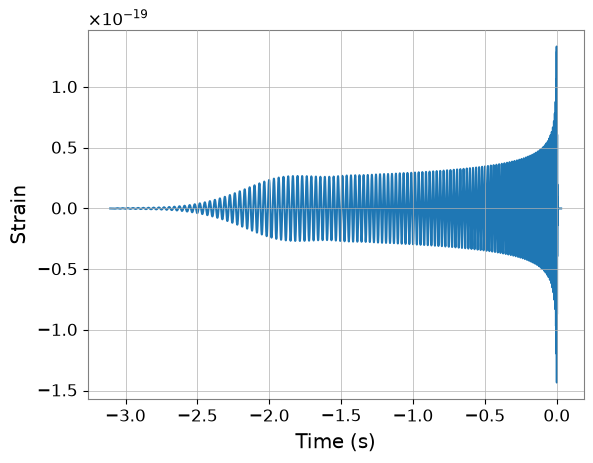

In [140]:
from pycbc.waveform import get_td_waveform

hp, hc = get_td_waveform(
    approximant="IMRPhenomXAS",
    mass1=10,
    mass2=10,
    inclination=np.pi/3,
    delta_t=1.0/4096,
    f_lower=30
)

plt.plot(hp.sample_times, hp) # sample times here gives the time belonging to every strain sample in hp
plt.xlabel("Time (s)")
plt.ylabel("Strain")
plt.show()


We can see the expected behaviour of an inspiralling compact binary

At early times the objects are further apart and orbit more slowly, giving a low frequency and low amplitude gravitational wave. As energy is lost through gravitational radiation the objects move closer together and orbit faster, so both the frequency and amplitude of the waveform increase

$$
f_{\rm GW} \uparrow
\qquad
|h| \uparrow
$$

This increasing frequency and amplitude towards the merger is the characteristic chirp behaviour

The merger occurs at approximately $t=0$, where the strain reaches its largest amplitude

The strain here is relatively large because we have not specified a realistic large source distance, later we will see that the amplitude approximately follows

$$
h \propto \frac{1}{D}
$$


## Changing the properties of the binary

Now we can look at how changing the actual physical properties of the binary changes the gravitational waveform we observe

Rather than defining the two masses separately we can describe the binary using the total mass

$$
M=m_1+m_2
$$

and the **mass ratio**

$$
q=\frac{m_2}{m_1}
$$

where we normally define $m_1$ as the larger mass, meaning

$$
q\leq1
$$

From this we can find the individual masses

$$
m_1=\frac{M}{1+q}
$$

$$
m_2=\frac{Mq}{1+q}
$$

We can then generate a waveform while changing the total mass, mass ratio, spin, distance and inclination to see what effect each parameter has


In [141]:
import numpy as np
import matplotlib.pyplot as plt

from pycbc.waveform import get_td_waveform


def plot_waveform(M=30, q=1, chi1=0, dist=100, inc=0):

    # Convert total mass and mass ratio into the two component masses
    mass1 = M / (1 + q)
    mass2 = M * q / (1 + q)

    # Generate the plus and cross gravitational wave polarisations
    hp, hc = get_td_waveform(
        approximant="IMRPhenomT",

        mass1=mass1,
        mass2=mass2,

        # Spin of object 1 along the orbital angular momentum
        spin1z=chi1,

        # Angle we view the binary from
        inclination=inc,

        # Distance to the binary in Mpc
        distance=dist,

        # Sample the waveform 2048 times per second
        delta_t=1.0 / 2048,

        # Start generating the waveform at 30 Hz
        f_lower=30
    )

    # Plot the plus polarisation against time
    plt.figure(figsize=(10, 4))
    plt.plot(hp.sample_times, hp)

    plt.xlabel("Time (s)")
    plt.ylabel("Strain")
    plt.title(
        f"M={M} Msun, q={q}, spin={chi1}, "
        f"distance={dist} Mpc, inclination={inc:.2f}"
    )

    plt.grid(alpha=0.3)
    plt.show()

    return hp, hc


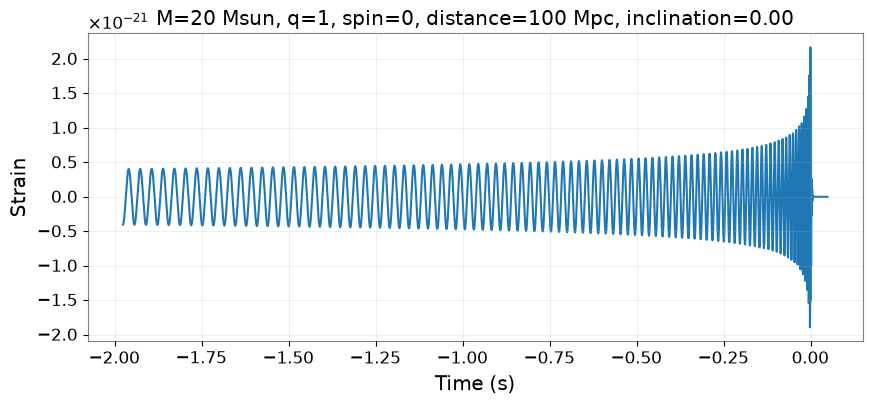

(<pycbc.types.timeseries.TimeSeries at 0x7e502c72df60>,
 <pycbc.types.timeseries.TimeSeries at 0x7e502c26f1c0>)

In [142]:
plot_waveform(M=20, q=1, chi1=0, dist=100, inc=0)


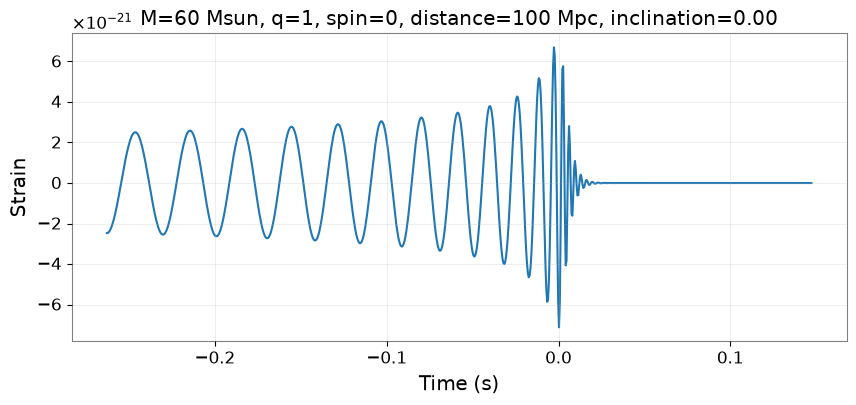

(<pycbc.types.timeseries.TimeSeries at 0x7e502c7b1320>,
 <pycbc.types.timeseries.TimeSeries at 0x7e502c7b1e80>)

In [143]:
plot_waveform(M=60, q=1, chi1=0, dist=100, inc=0)


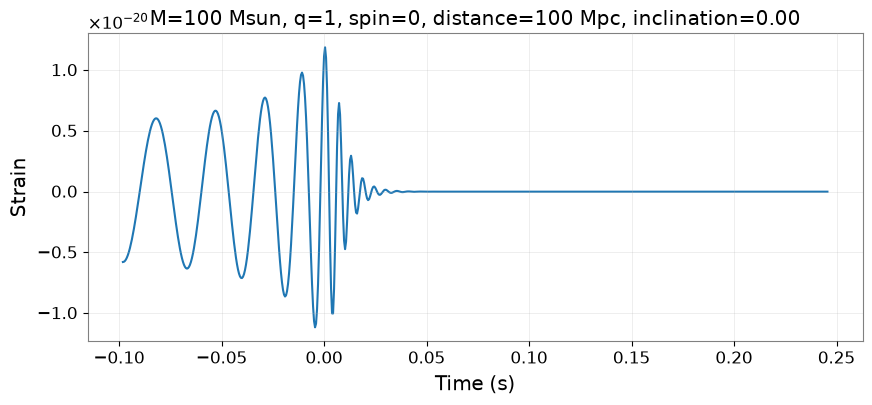

(<pycbc.types.timeseries.TimeSeries at 0x7e502d361be0>,
 <pycbc.types.timeseries.TimeSeries at 0x7e502d3639a0>)

In [144]:
plot_waveform(M=100, q=1, chi1=0, dist=100, inc=0)


### Effect of total mass

Increasing the total mass makes the waveform shorter and gives us fewer cycles before merger

This is because more massive binaries merge at lower gravitational wave frequencies

Since we start all of the waveforms at

$$
f_{\rm lower}=30\ {\rm Hz}
$$

a more massive binary is already closer to merger when it enters the frequency range we are looking at, hence as mass increasesm there are fewer cycles before the merger

What about distance?


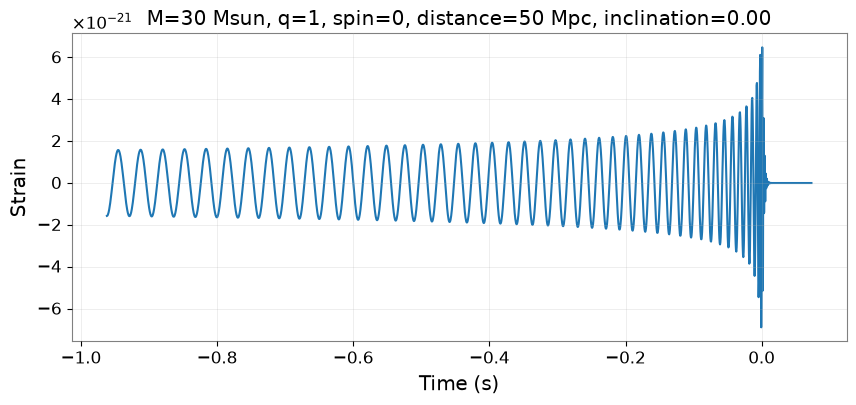

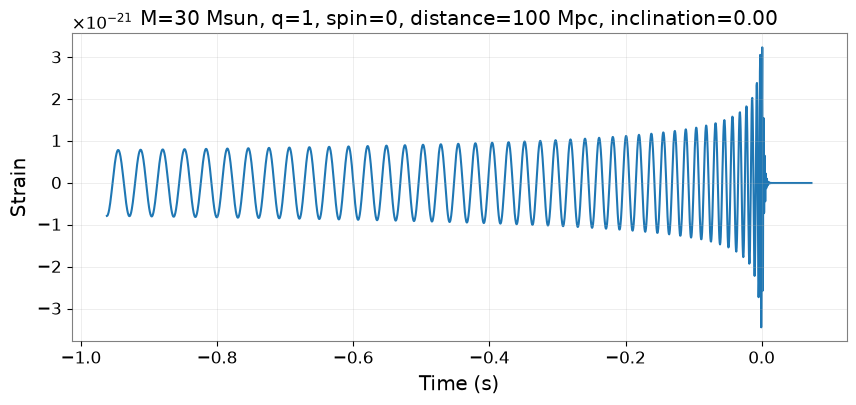

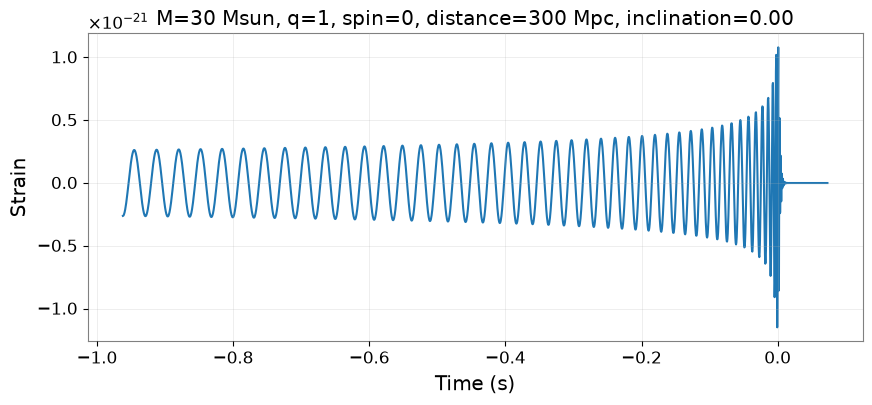

(<pycbc.types.timeseries.TimeSeries at 0x7e502d360440>,
 <pycbc.types.timeseries.TimeSeries at 0x7e502c53c210>)

In [145]:
plot_waveform(M=30, q=1, chi1=0, dist=50, inc=0)
plot_waveform(M=30, q=1, chi1=0, dist=100, inc=0)
plot_waveform(M=30, q=1, chi1=0, dist=300, inc=0)


### Effect of distance

Changing the distance keeps the basic waveform shape, so it doesnt really change the orbit evolves for the binary

Instead it mainly changes the amplitude of the observed strain

$$
h\propto\frac{1}{D}
$$

Therefore if the distance is doubled the strain is approximately halved

$$
D\rightarrow2D
\qquad\Rightarrow\qquad
h\rightarrow\frac{h}{2}
$$

So a binary further away produces the same intrinsic waveform but we observe a weaker signal

We can also look at mass ratio


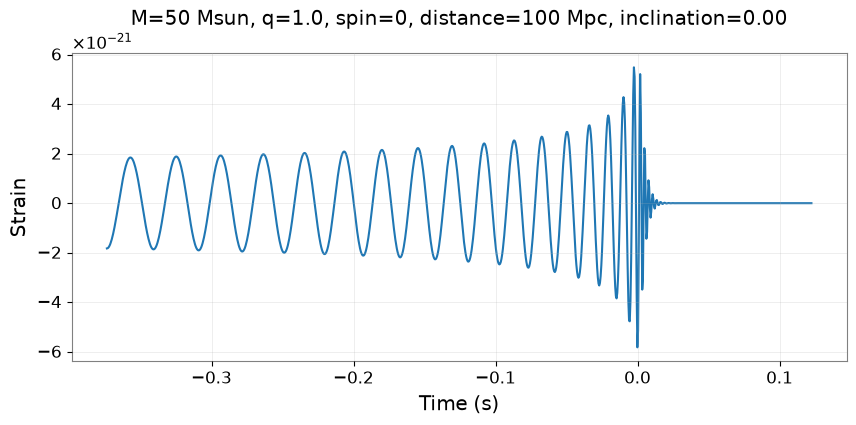

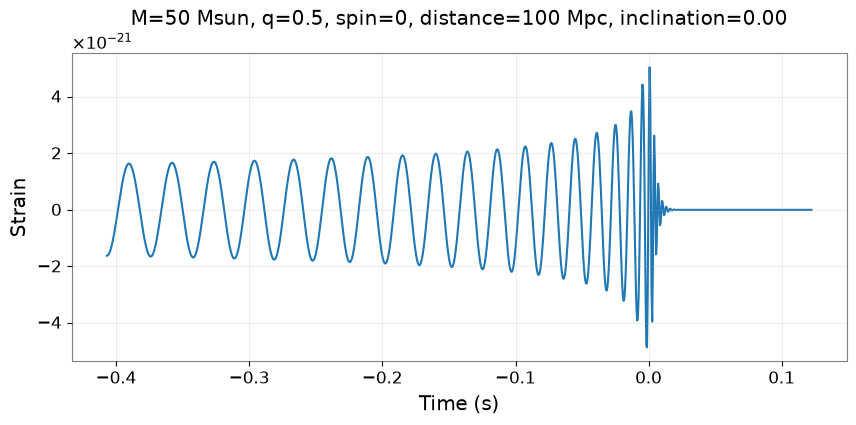

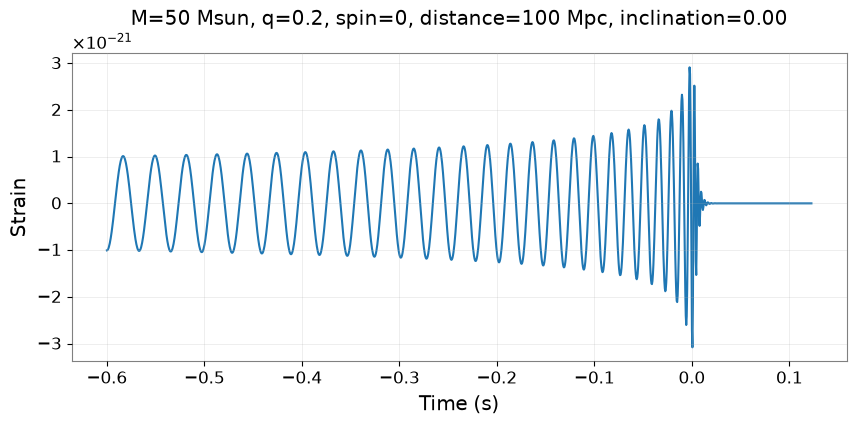

(<pycbc.types.timeseries.TimeSeries at 0x7e50197e8b40>,
 <pycbc.types.timeseries.TimeSeries at 0x7e50197e91d0>)

In [146]:
plot_waveform(M=50, q=1.0, chi1=0, dist=100, inc=0)
plot_waveform(M=50, q=0.5, chi1=0, dist=100, inc=0)
plot_waveform(M=50, q=0.2, chi1=0, dist=100, inc=0)


### Effect of the mass ratio

The mass ratio is

$$
q=\frac{m_2}{m_1}
$$

So $q = 1$ means the two objects have equal mass, while a smaller value of $q$ means the system becomes increasingly unequal

Changing the mass ratio changes the actual orbital dynamics of the binary and therefore changes the waveform evolution

This is different from changing distance, which just scaled the observed amplitude as we saw

Okay lets also look at the spin:


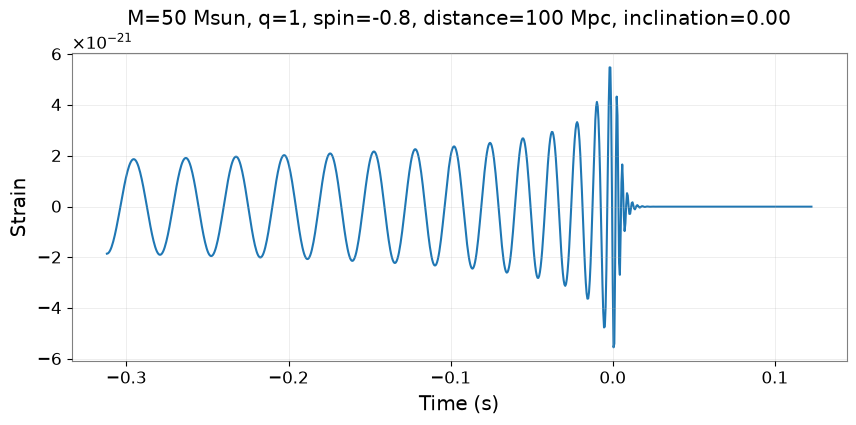

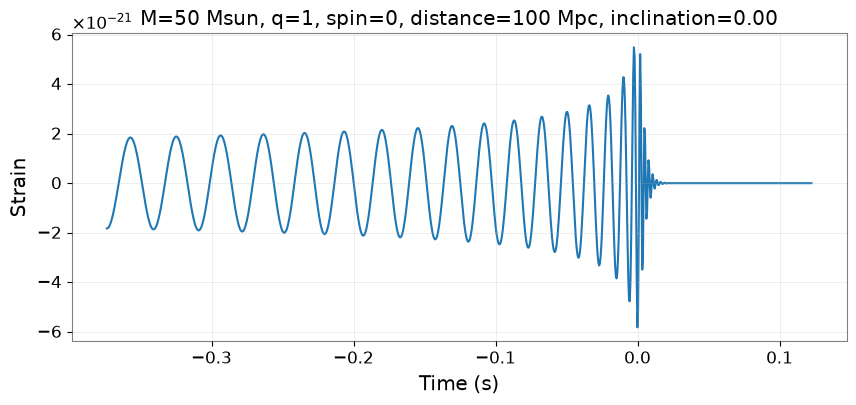

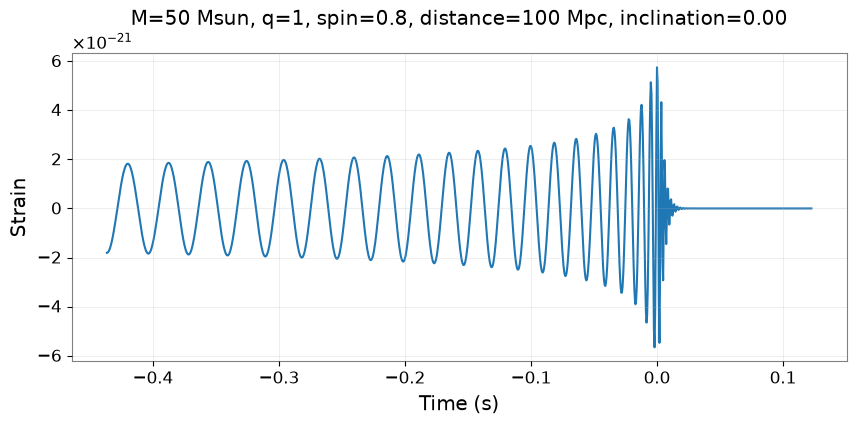

(<pycbc.types.timeseries.TimeSeries at 0x7e501976fa80>,
 <pycbc.types.timeseries.TimeSeries at 0x7e50197ebe70>)

In [147]:
plot_waveform(M=50, q=1, chi1= -0.8, dist=100, inc=0)
plot_waveform(M=50, q=1, chi1 =0, dist=100, inc=0)
plot_waveform(M=50, q=1, chi1= 0.8, dist=100, inc=0)


### Effect of spin

chi1 is the component of the spin of the first object along the orbital angular momentum

$\chi_1>0$ corresponds to aligned spin while $\chi_1<0$ corresponds to spin in the opposite direction

Spin changes the dynamics of the binary and therefore changes the evolution of the gravitational waveform towards merger

Okay one finallll one, the inclination...


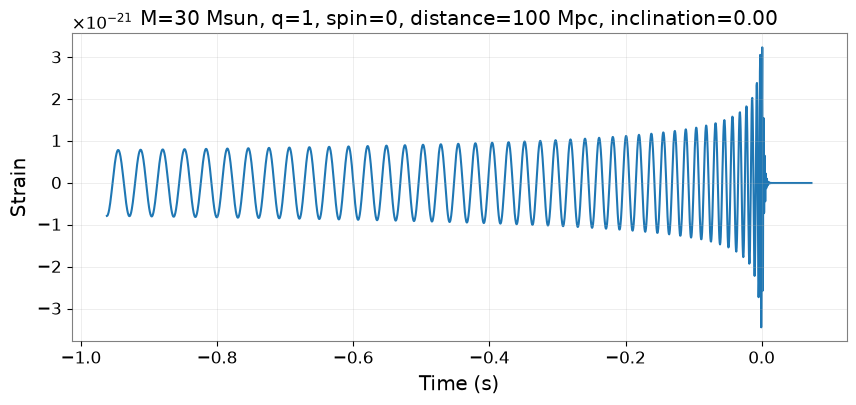

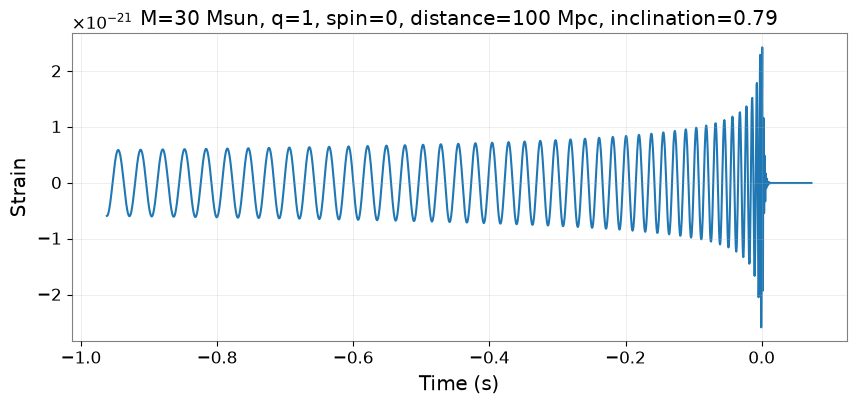

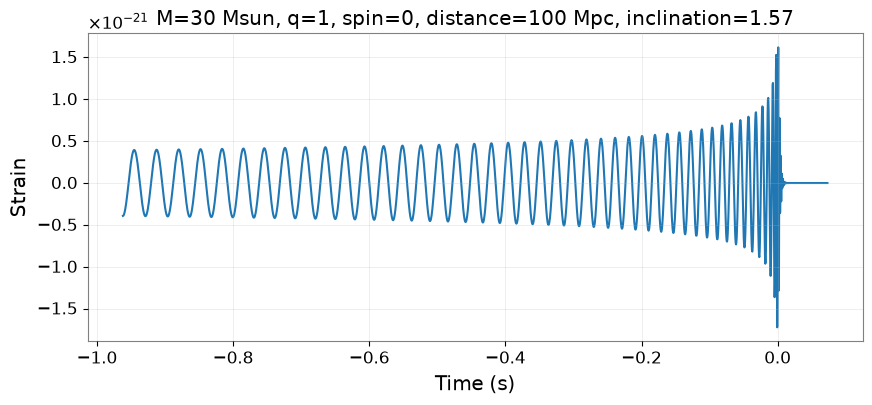

(<pycbc.types.timeseries.TimeSeries at 0x7e5019587700>,
 <pycbc.types.timeseries.TimeSeries at 0x7e50194029e0>)

In [148]:
plot_waveform(M=30, q=1, chi1=0, dist=100, inc=0)
plot_waveform(M=30, q=1, chi1=0, dist=100, inc=np.pi / 4)
plot_waveform(M=30, q=1, chi1=0, dist=100, inc=np.pi / 2)


### Effect of inclination

Inclination describes the angle at which we view the binary. $\iota=0$ corresponds to viewing the system roughly face on, while $\iota=\frac{\pi}{2}$ corresponds to viewing the orbit edge on.

Changing inclination does not change the intrinsic binary itself

Instead it changes how the two gravitational wave polarisations are projected towards us, changing the signal that we observe


### Why changing these parameters matters

The waveform is determined by the physical properties of the binary

Intrinsic properties such as mass, mass ratio and spin change the actual dynamics and therefore the waveform evolution

Extrinsic properties such as distance and inclination mainly change how that waveform is observed by us

This is how a gravitational wave detection can tell us about the masses, spins and other properties of objects that may be billions of light years away


### Lets look at GW170817

GW170817 was a binary neutron star merger

From the GWTC 1 catalogue we have approximately

$$
m_1=1.46M_\odot
$$

$$
m_2=1.27M_\odot
$$

$$
D=40\ {\rm Mpc}
$$

The masses quoted in the catalogue are source frame masses, while the detector sees redshifted masses

$$
m_{\rm det}=(1+z)m_{\rm source}
$$

For GW170817

$$
z\approx0.01
$$

so the difference is only around $1\%$


Detector frame mass 1: 1.4746
Detector frame mass 2: 1.2827
Waveform duration: 56.3076171875 s


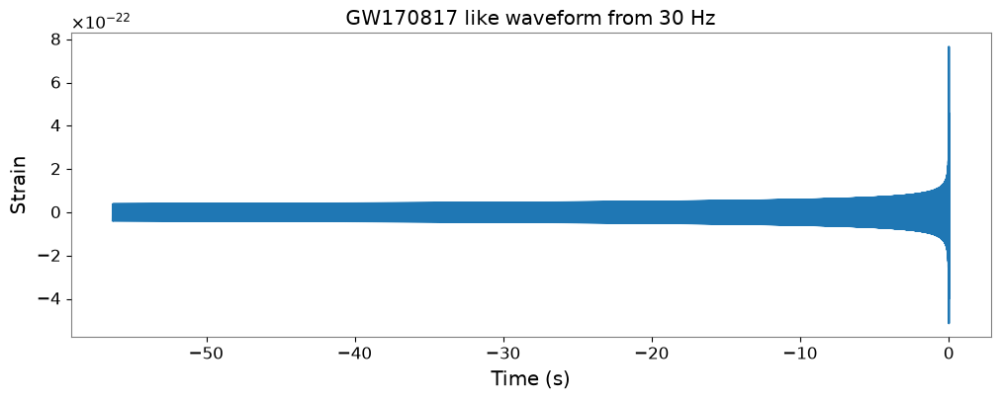

In [149]:
from pycbc.waveform import get_td_waveform
import matplotlib.pyplot as plt

# GWTC 1 estimates for GW170817
m1_source = 1.46
m2_source = 1.27
z = 0.01
distance = 40

# Convert source frame masses into detector frame masses
m1 = m1_source * (1 + z)
m2 = m2_source * (1 + z)

# Generate the waveform starting from 30 Hz
hp_170817, hc_170817 = get_td_waveform(
    approximant="IMRPhenomT",
    mass1=m1,
    mass2=m2,
    distance=distance,
    delta_t=1.0 / 4096,
    f_lower=30
)

# Find how long the generated waveform lasts
duration_170817 = hp_170817.duration

print("Detector frame mass 1:", m1)
print("Detector frame mass 2:", m2)
print("Waveform duration:", duration_170817, "s")

# Plot the plus polarisation
plt.figure(figsize=(12, 4))

plt.plot(hp_170817.sample_times, hp_170817)

plt.xlabel("Time (s)")
plt.ylabel("Strain")
plt.title("GW170817 like waveform from 30 Hz")
plt.grid()

plt.show()


We can see that the GW170817 like waveform lasts for around $56$ seconds after entering the waveform at $30$ Hz

due to it being a low mass binary neutron star system, it evolves through the detector frequency range relatively slowly and completes a very large number of cycles before merger, this is why we see it almost filled as the osccillations are too close together

However, we can still see the overall chirp behaviour

$$
f_{\rm GW}\uparrow
\qquad
|h|\uparrow
$$

as the system approaches the merger at approximately $t=0$

This is much longer than we expect for a high mass binary black hole system, showing the influence of the masses

lets have a peak of a zoomed in version


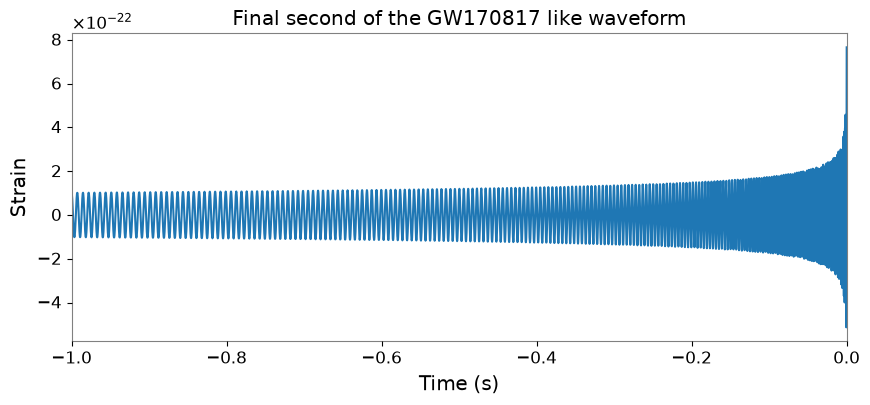

In [150]:
# Look only at the final second before merger
plt.figure(figsize=(10, 4))

plt.plot(hp_170817.sample_times, hp_170817)

plt.xlim(-1, 0)

plt.xlabel("Time (s)")
plt.ylabel("Strain")
plt.title("Final second of the GW170817 like waveform")

plt.grid()
plt.show()


This is at the last second, we can see very rapid oscillations


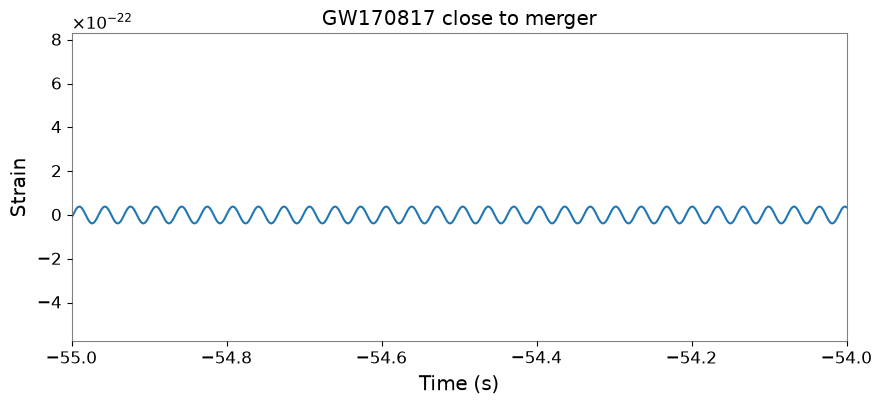

In [151]:
# Final second before merger
plt.figure(figsize=(10, 4))
plt.plot(hp_170817.sample_times, hp_170817)

plt.xlim(-55, -54)

plt.xlabel("Time (s)")
plt.ylabel("Strain")
plt.title("GW170817 close to merger")

plt.grid()
plt.show()


When we are far away from the merger, the oscillations are much slower!!


### Looking at GW150914 (black hole merger this time instead of a neutron star)


We can now repeat the same process for GW150914, which was a binary black hole merger

The component masses are $m_1\sim36M_\odot$ $and m_2\sim29M_\odot$ as searched up

clearlyu larger than the masses in GW170817, so we should expect the system to move through the detector frequency range much more quickly

Therefore from the same lower frequency of $30$ Hz we expect a much shorter waveform


Waveform duration: 0.38623046875 s


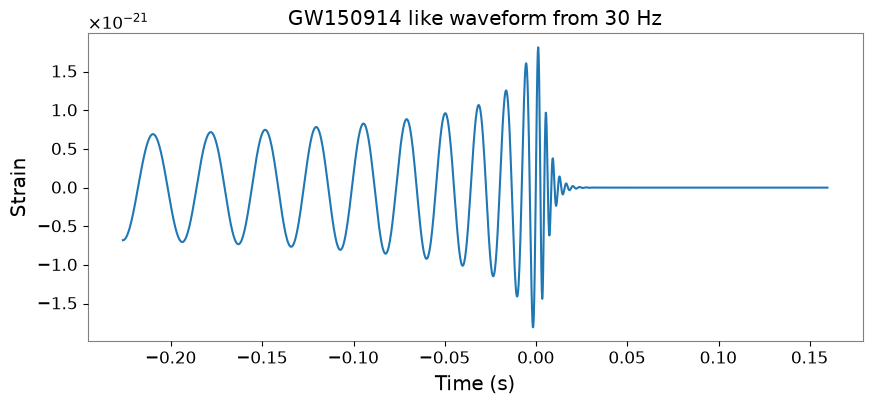

In [152]:
# Approximate parameters for GW150914
m1 = 36
m2 = 29
distance = 410

# Generate the waveform starting from 30 Hz
hp_150914, hc_150914 = get_td_waveform(
    approximant="IMRPhenomT",
    mass1=m1,
    mass2=m2,
    distance=distance,
    delta_t=1.0 / 4096,
    f_lower=30
)

# Duration of the waveform
duration_150914 = hp_150914.duration

print("Waveform duration:", duration_150914, "s")

# Plot the plus polarisation
plt.figure(figsize=(10, 4))

plt.plot(hp_150914.sample_times, hp_150914)

plt.xlabel("Time (s)")
plt.ylabel("Strain")
plt.title("GW150914 like waveform from 30 Hz")

plt.grid()
plt.show()


We can clearly see that GW150914 spends much less time in the frequency range above $30$ Hz than GW170817

The higher mass black hole system therefore reaches merger much more quickly once it enters the detector frequency range


In [153]:
print("GW170817 duration:", hp_170817.duration, "s")
print("GW150914 duration:", hp_150914.duration, "s")

print(
    "GW170817 is",
    hp_170817.duration / hp_150914.duration,
    "times longer from 30 Hz"
)


GW170817 duration: 56.3076171875 s
GW150914 duration: 0.38623046875 s
GW170817 is 145.78761061946904 times longer from 30 Hz


### GW170817 vs GW150914

The comparison between these two shows how strongly the binary masses affect the gravitational waveform

GW170817 contains two low mass neutron stars, so it spends a long time inspiralling through the detector frequency range

GW150914 contains two much heavier black holes, so once it reaches $30$ Hz it is already close to merger

Therefore

$$
\text{low mass binary}
\rightarrow
\text{long inspiral and many cycles}
$$

$$
\text{high mass binary}
\rightarrow
\text{short inspiral and fewer cycles}
$$

This is why different types of compact binaries can produce gravitational wave signals with very different durations even when we start observing them from the same frequency


# Signal Processing

## The Fourier transform

In gravitational wave analysis we usually start with some measured quantity as a function of time

$$
s(t)
$$

For example this could be the strain recorded by a detector

However, instead of asking how the signal changes with time we can ask which frequencies make up that signal

The Fourier transform converts between these two descriptions

$$
s(t)
\rightarrow
\tilde{s}(f)
$$

where

$$
\tilde{s}(f)
=
\int_{-\infty}^{+\infty}
s(t)e^{-2\pi i f t}\,dt
$$

So

- $s(t)$ tells us how the signal changes with time
- $\tilde{s}(f)$ tells us the frequency content of the signal

The main intuition is that the Fourier transform asks how strongly the signal contains oscillations at each possible frequency


The inverse Fourier transform lets us recover the original time signal

$$
s(t)
=
\int_{-\infty}^{+\infty}
\tilde{s}(f)e^{2\pi ift}\,df
$$

Hence

$$
s(t)
\leftrightarrow
\tilde{s}(f)
$$


### Useful Fourier transform properties

The Fourier transform is linear

$$
as_1(t)+bs_2(t)
\rightarrow
a\tilde{s}_1(f)+b\tilde{s}_2(f)
$$

So if detector data contains

$$
d(t)=s(t)+n(t)
$$

then

$$
\tilde d(f)=\tilde s(f)+\tilde n(f)
$$

A shift in time

$$
s(t-t_0)
$$

produces

$$
\tilde{s}(f)e^{-2\pi ift_0}
$$

So changing when a signal occurs mainly changes the Fourier phase rather than its frequency content

For a real signal

$$
\tilde{s}(-f)=\tilde{s}^{*}(f)
$$

meaning the negative frequency part contains no independent information

Another useful property is

$$
s'(t)
\rightarrow
2\pi if\tilde{s}(f)
$$

showing how some operations become much simpler in frequency space

### Convolution theorem

Convolution is defined as

$$
(s*g)(t)
=
\int_{-\infty}^{+\infty}
s(\tau)g(t-\tau)\,d\tau
$$

The Fourier transform turns convolution into simple multiplication

$$
s*g
\rightarrow
\tilde{s}(f)\tilde{g}(f)
$$

Equivalently, multiplying two functions in the time domain produces a convolution in the frequency domain

This becomes important when we only observe a signal over a finite time window

> Parseval's theorem tells us that inner products can be calculated equivalently in the time or frequency domain, which will become useful later for matched filtering


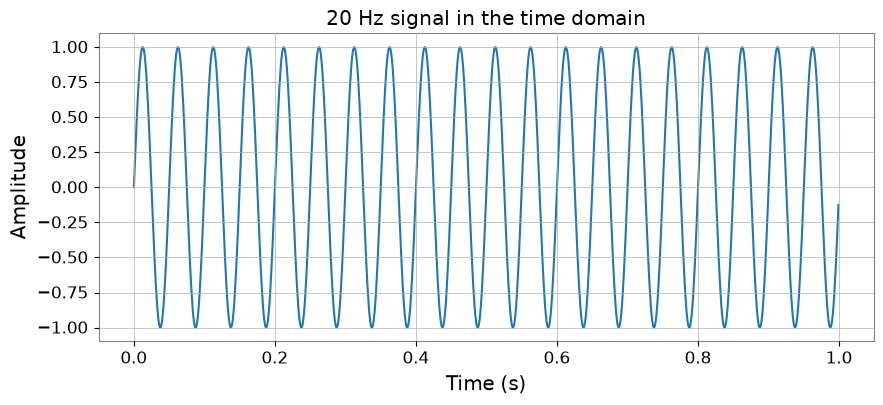

In [154]:
import numpy as np
import matplotlib.pyplot as plt

# Observe the signal for 1 second
T = 1
sample_rate = 1000

# Time samples
t = np.arange(0, T, 1 / sample_rate)

# A simple 20 Hz sine wave
frequency = 20
signal = np.sin(2 * np.pi * frequency * t) 

plt.figure(figsize=(10, 4))
plt.plot(t, signal)

plt.xlabel("Time (s)")
plt.ylabel("Amplitude")
plt.title("20 Hz signal in the time domain")
plt.show()


### Time frequency uncertainty

There is a trade off between how precisely a signal can be localised in time and how precisely its frequency can be known

$$
\sigma_t\sigma_f\geq\frac{1}{4\pi}
$$

where $\sigma_t$ describes the spread of the signal in time and $\sigma_f$ describes its spread in frequency

So roughly

$$
\text{short signal in time}
\rightarrow
\text{broad range of frequencies}
$$

while

$$
\text{long signal in time}
\rightarrow
\text{more concentrated frequency content}
$$

This is important because the length of time we observe a signal directly affects how well we can resolve its frequency

## Finite observation time and windowing

In reality we never observe a signal for an infinite amount of time

Instead we only observe it over some finite duration $T$

We can represent this using a window function

$$
d(t)=w(t)s(t)
$$

where

- $s(t)$ is the true underlying signal
- $w(t)$ selects the section of the signal that we actually observe
- $d(t)$ is the finite piece of data we analyse

For a simple rectangular window, $w(t)=1$ during the observation and $0$ outside it

### Why does windowing change the Fourier transform

From the convolution theorem we know that multiplication in time becomes convolution in frequency and since,

$$
d(t)=w(t)s(t)
$$

we get

$$
\tilde d(f) = \tilde s(f)*\tilde w(f)
$$

or written explicitly

$$
\tilde d(f)
=
\int_{-\infty}^{+\infty}
\tilde s(f')\tilde w(f-f')\,df'
$$

So the true frequency spectrum $\tilde s(f)$ gets convolved with the Fourier transform of the window

This causes the frequency content to become **smeared out**

Hence

$$
\text{finite observation}
\rightarrow
\text{windowing}
\rightarrow
\text{frequency smearing}
$$

This is the origin of **spectral leakage**

### Example with a sinusoid

Consider a pure sinusoid

$$
s(t)=\sin(2\pi f_0t)
$$

If we could observe it forever then its Fourier transform would contain perfectly sharp peaks at

$$
f=\pm f_0
$$

However, when we observe it only for a finite time $T$, we multiply it by a window

For a rectangular window

$$
\tilde w(f)
=
Te^{-i\pi fT}\operatorname{sinc}(\pi fT)
$$

So instead of a perfectly sharp frequency peak we obtain a broadened sinc shaped peak

The characteristic width is roughly

$$
\Delta f\sim\frac{1}{T}
$$

Therefore

$$
T\uparrow
\Rightarrow
\Delta f\downarrow
$$

So observing for longer gives us a narrower frequency peak and therefore better frequency resolution.

It is important to realise that the extra frequency spread is not new physical frequencies in the original signal. The spreading appears because we only observed the signal through a finite window


## Sampling

Real detector data is measured at discrete times separated by

$$
\Delta t
$$

giving the sampling frequency

$$
f_s=\frac{1}{\Delta t}
$$

Sampling causes the frequency spectrum to repeat every $f_s$

## Nyquist Frequency

To avoid the repeated frequency spectra overlapping we require

$$
f_{\max}<\frac{f_s}{2}
$$

where

$$
f_{\rm Nyq}=\frac{f_s}{2}
$$

Frequencies above this can appear as incorrect lower frequencies, known as **aliasing**

## Frequency Resolution

For $N$ samples over a total time

$$
T=N\Delta t
$$

the spacing between frequency bins is

$$
\Delta f=\frac{1}{T}
$$

So longer observations give better frequency resolution

## DFT and FFT

The **Discrete Fourier Transform** converts our finite set of time samples into frequency samples

$$
s_n
\rightarrow
\tilde{s}_k
$$

The **FFT** is simply an efficient algorithm used to calculate the DFT

## Detector Noise

Gravitational wave detector data can be written as

$$
d(t)=s(t)+n(t)
$$

where $s(t)$ is the GW signal and $n(t)$ is detector noise

The noise is often treated as approximately stationary over suitable periods of time

## Power Spectral Density

The **PSD**

$$
S_n(f)
$$

describes how the detector noise power is distributed across frequency

This is important because LIGO is much noisier at some frequencies than others, so frequencies should not all be treated equally

## Estimating the PSD

A periodogram estimates the PSD using the squared Fourier amplitude

$$
P(f)\propto|\tilde d(f)|^2
$$

In practice we often use **Welch's method**, where the data is split into segments, windowed and the periodograms are averaged

This reduces the large variance of a single periodogram

## Whitening

Whitening rescales the frequency domain data using the PSD

$$
\tilde d_w(f)\propto
\frac{\tilde d(f)}{\sqrt{S_n(f)}}
$$

This makes the noise approximately equally weighted across frequency

## Time Frequency Analysis

A normal Fourier transform tells us which frequencies are present but not when they occur

For signals such as GW chirps we therefore also want a representation in both time and frequency

## STFT

The **Short Time Fourier Transform** applies Fourier transforms to short sections of the data

This produces a spectrogram showing how the frequency content changes with time

There is a trade off between time and frequency resolution

## Q Transform

The Q transform changes the window size depending on frequency

$$
T(f)=\frac{Q}{f}
$$

High frequencies therefore use shorter windows while low frequencies use longer windows

This is useful for GW chirps, bursts and detector glitches


That may have been quick, but I dont want to spend too much time disecting the lecture.. the main ideas were jotted down


### Tutorial 3.1: Fourier transforms


#### The Discrete Fourier Transform: basics

For digital data we sample the signal at fixed time intervals

$$
s_j=s(j\Delta t)
$$

with sampling frequency

$$
f_s=\frac{1}{\Delta t}
$$

DFT and inverse DFT can be written as

$$
\tilde{s}_k
=
\Delta t
\sum_{j=0}^{N-1}
\omega^{-jk}s_j
$$

$$
s_j
=
\Delta f
\sum_{k=0}^{N-1}
\omega^{jk}\tilde{s}_k
$$

where

$$
\omega=e^{2i\pi/N}
$$

The FFT is just the fast algorithm used to calculate this, reducing the computing cost from roughly $\mathcal O(N^2)$ to $\mathcal O(N\log N)$

We also have:

$$
\Delta t\Delta f=\frac{1}{N}
$$

and

$$
\Delta f=\frac{1}{T}
$$

np.fft.rfft() calculates the FFT, but we multiply by $\Delta t$ so that it has the scaling of the continuous Fourier transform

For a real signal the negative frequency information is redundant, so `np.fft.rfft()` keeps the non negative frequencies for us


## An artificial signal

Lets look at 3 sin waves

We use

$$
f_s=1024\ \mathrm{Hz}
$$

and frequencies of

$$
23\ \mathrm{Hz},\qquad42\ \mathrm{Hz},\qquad123\ \mathrm{Hz}
$$

with different weights

The highest frequency is well below

$$
f_{\rm Nyq}=\frac{1024}{2}=512\ \mathrm{Hz}
$$

so the sampling rate is easily high enough


Text(0.5, 1.0, 'Artificial data in the time domain')

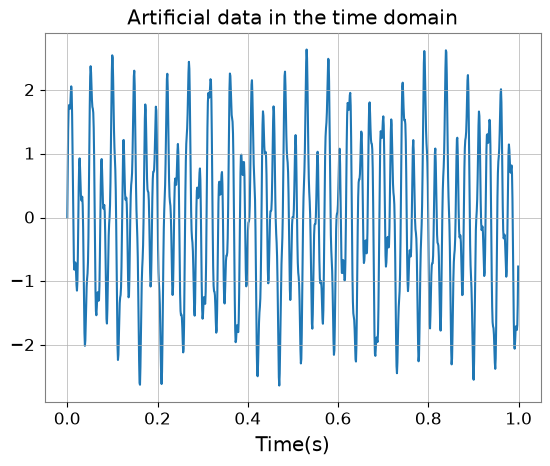

In [155]:
# -- Define the sample rate and time array
fs = 1024  # Hz
dt = 1./fs
time = np.arange(0., 1., dt)

# -- Define 3 sine waves
sine1 = np.sin(2*np.pi*23*time)
sine2 = np.sin(2*np.pi*42*time)
sine3 = np.sin(2*np.pi*123*time)

# -- Add the components together, with arbitrary weights
data = 0.8*sine1 + 1.5*sine2 + 0.4*sine3

# -- Plot the signal in the time domain
plt.figure()
plt.plot(time, data)
plt.xlabel('Time(s)')
plt.title('Artificial data in the time domain')


The time domain signal looks fairly messy because all three oscillations are sitting on top of each other

But we already know what we expect to find when unravelling it

$$
23\ \mathrm{Hz},\qquad42\ \mathrm{Hz},\qquad123\ \mathrm{Hz}
$$

So we should see whether the Fourier transform can separate those components back out


### Transforming into the frequency domain

We can now transform this into the frequency domain using rfft

`np.fft.rfftfreq()` gives the frequency belonging to each value returned by `rfft`

We then plot

$$
|\tilde{s}(f)|^2
$$

so we are looking at how strongly the different frequencies contribute

Since the signal is real we only need the non negative frequencies, hence the plot is limited to

$$
0\leq f\leq\frac{f_s}{2}
$$


Text(0.5, 1.0, 'Artificial data in the Frequency Domain')

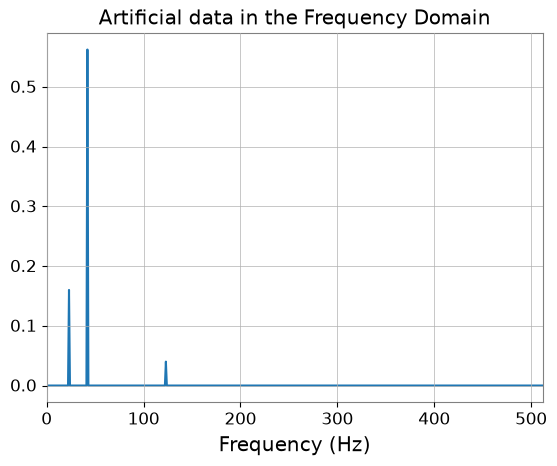

In [156]:
# Apply the real Fast Fourier Transform (rfft)
data_freq = dt * np.fft.rfft((data))  
frequencies = np.fft.rfftfreq(len(data), d=dt)

plt.plot(frequencies, np.abs(data_freq)**2)
plt.xlim(0, fs/2)
plt.xlabel('Frequency (Hz)')
plt.title("Artificial data in the Frequency Domain")


We can see that the frequency domain is much simpler

There are three sharp peaks exactly where we expect and the $42$ Hz component is the strongest because it had the largest weight, while the $123$ Hz component is the weakest


### Sampling Frequency and the Nyquist Frequency

When we sample a continuous signal we lose some information because we only measure it every $\Delta t$

For this example we take a simple cosine with

$$
f_0=20\ {\rm Hz}
$$

over $1$ second and then see what happens as we change the sampling frequency

The idea is that we need enough samples to distinguish the true oscillation rather than accidentally reconstructing a different one


In [157]:
# "Continuous time", simply a vector of times with a small dt
continuous_time = np.arange(0, 1, 1./2**10)
continuous_time.shape, continuous_time[1] - continuous_time[0]


((1024,), np.float64(0.0009765625))

In [158]:
# Generate our true, "continuous" sinusoidal signal
f0 = 20
cos20 = np.cos(2*np.pi*f0*continuous_time)


In [ ]:
from ipywidgets import interact, widgets

def coeff(j,N):
    if j==0 or j==N//2:
        return 1
    else:
        return 2
def trigo_polynomial(data, dt, time):
    N = len(data)
    data_rfft = dt * np.fft.rfft(data)
    df = 1/(N * dt)
    return df * np.real(np.sum(np.vstack(np.array([data_rfft[j] * coeff(j,N) * np.cos(2*np.pi*time * j) for j in range(0,N//2+1)])), axis=0))

def plot_sampling(log2fs):
    fs = 2**log2fs
    dt = 1/fs
    T = 1.
    df = 1/T
    sampling_time = np.arange(0, T, dt)
    N = len(sampling_time)
    sampled_cos20 = np.cos(2*np.pi*f0*sampling_time)
    continuous_sampled_signal = trigo_polynomial(sampled_cos20, dt, continuous_time)
    fig, ax = plt.subplots(1,1, figsize=[16,4])
    ax.plot(continuous_time, cos20, label='True signal', color='C0')
    ax.scatter(sampling_time, sampled_cos20, marker='o', label=f'Discrete samples ($f_s = {fs}Hz$)', color='C1')
    ax.plot(continuous_time, continuous_sampled_signal, label=f'Sampled signal', color='C1')
    ax.legend(loc='upper right')
    ax.set_xlabel('t (s)')

interact(
    plot_sampling,
    log2fs = widgets.FloatSlider(value=4, min=1, max=10, step=1, description='$log_2(f_s)$')
)


interactive(children=(FloatSlider(value=4.0, description='$log_2(f_s)$', max=10.0, min=1.0, step=1.0), Output(…

<function __main__.plot_sampling(log2fs)>

We can see what happens when we change the slider and see that when the sampling frequency is too low the sampled points can still be joined by a completely different oscillation

For a signal containing frequencies up to $f_{\max}$ we require $f_s>2f_{\max}$

Equivalently the highest frequency we can correctly represent is the Nyquist frequency

$$
f_{\rm Nyq}=\frac{f_s}{2}
$$

For the $20$ Hz signal we therefore need $f_s>40\ {\rm Hz}$

So $32$ Hz is not enough, while $64$ Hz allows us to reconstruct the original signal

If the sampling frequency is too low, higher frequencies can appear as incorrect lower frequencies. This is **aliasing**


### Fourier Transform of a Gravitational Wave Signal

We can now apply the same ideas to an actual gravitational wave waveform

We first generate a time domain signal using `IMRPhenomT` with component masses $m_1=10M_\odot$ and $m_2=15M_\odot$, at a distance of $100$ Mpc

We use a sampling frequency of $f_s=4096\ {\rm Hz}$ and start the waveform at $f_{\rm lower}=30\ {\rm Hz}$


Text(0.5, 1.0, 'Whole waveform')

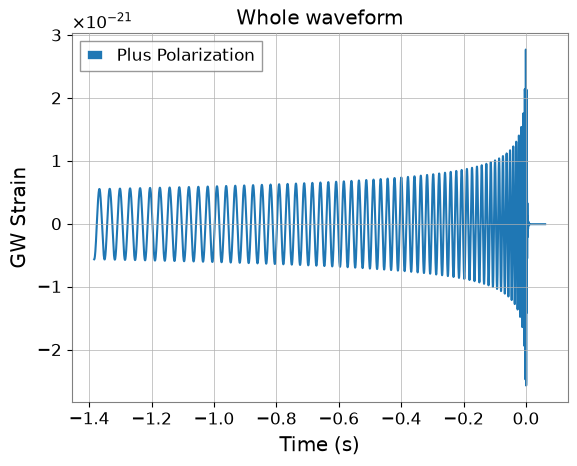

In [160]:
from pycbc.waveform import get_td_waveform, get_fd_waveform

mass1 = 10
mass2 = 15
distance = 100

fs = 4096
f_lower = 30
hp, hc = get_td_waveform(
    approximant='IMRPhenomT',
    mass1=mass1,
    mass2=mass2,
    distance=distance,
    delta_t=1.0/fs,
    f_lower=f_lower
)

time = hp.sample_times
plt.plot(time, hp, label='Plus Polarization')
plt.xlabel('Time (s)')
plt.ylabel('GW Strain')
plt.legend()
plt.title('Whole waveform')


We can also generate the same physical system directly in the frequency domain using `IMRPhenomXAS`

This gives us $\tilde h(f)$ directly rather than first generating $h(t)$ and then applying an FFT


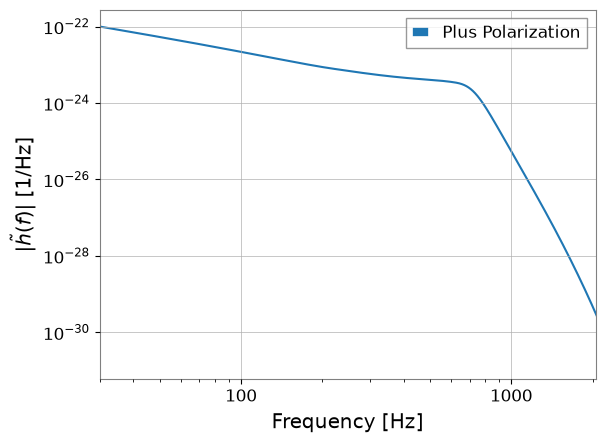

In [161]:
hpf, hcf = get_fd_waveform(
    approximant='IMRPhenomXAS',
    mass1=mass1,
    mass2=mass2,
    distance=distance,
    delta_f=0.125,
    f_lower=f_lower,
    f_ref=800.
)

plt.loglog(hpf.sample_frequencies, np.abs(hpf), label='Plus Polarization')
plt.xlabel('Frequency [Hz]')
plt.ylabel(r'$|\tilde{h}(f)|$ [1/Hz]')
plt.xlim([f_lower, fs/2])
plt.legend()
plt.show()


The signal begins around $f_{\rm lower}=30\ {\rm Hz}$ and then extends to higher frequencies as the binary approaches merger

The amplitude eventually falls rapidly at high frequencies, so the frequency content close to and above $f_{\rm Nyq}=2048\ {\rm Hz}$ is negligible

We can now Fourier transform the time domain waveform ourselves

Since the signal is real we use `rfft`, and multiply by $\Delta t$ to give the physical Fourier transform scaling


Text(0.5, 1.0, 'Direct FFT of time-domain waveform')

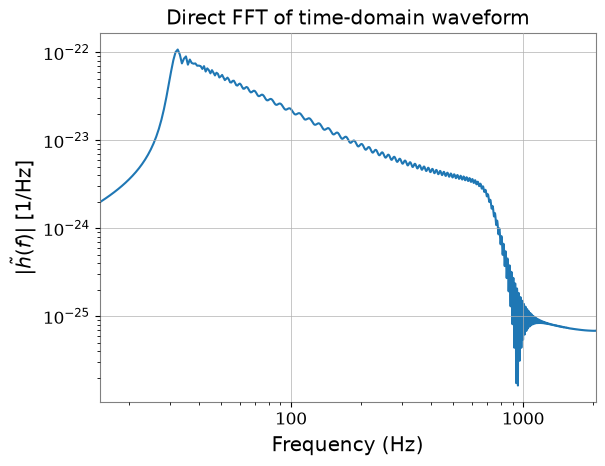

In [162]:
# Apply the real Fast Fourier Transform (rfft)
dt = hp.delta_t
hp_fft = dt * np.fft.rfft(hp) 
freq_fft = np.fft.rfftfreq(len(hp), d=dt)

plt.loglog(freq_fft, np.abs(hp_fft))
plt.xlim(f_lower/2, fs/2)
plt.xlabel('Frequency (Hz)')
plt.ylabel(r'$|\tilde{h}(f)|$ [1/Hz]')
plt.title("Direct FFT of time-domain waveform")


This does not look as smooth as the waveform generated directly in the frequency domain as we can see oscillations appearing in the spectrum which are not part of the physical gravitational wave signal

These are **Gibbs oscillations**

> The FFT assumes that our finite data repeats periodically, at the end of the waveform it decays towards zero, but the start of the waveform has been cut off sharply
>
> So when the signal is treated as periodic there is a discontinuity between the end and the beginning and sharp feature in time produces power across many frequencies, giving the artificial **Gibbs oscillations** we can see in the spectrum

We therefore need to smooth the edges before taking the Fourier transform


### Windowing

The sharp edge at the start of the waveform produces artificial oscillations after the Fourier transform and we can reduce this using a **Tukey window**, which smoothly brings the edges of the signal towards zero.

Here we use $\alpha=0.2$, meaning $20\%$ of the interval is tapered

We also **zero pad** the waveform by adding zeros to the end


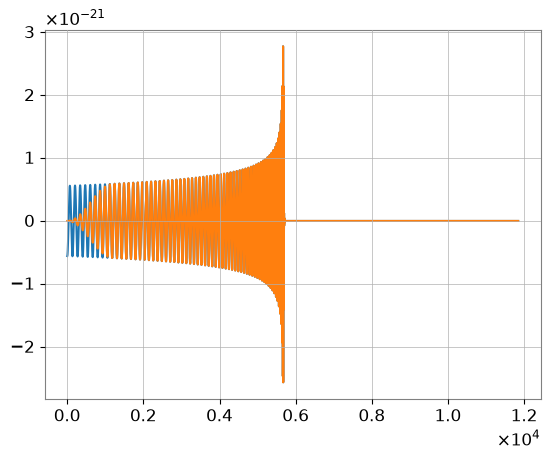

In [163]:
# The window forces the signal to zeros at the beginning and end.  
# This must be done before applying a Fourier Transform
# The parameter alpha is the fraction of the time interval to be tapered; for convenience, we also zero-pad the waveform.

hp_pad = np.concatenate((hp, np.zeros(len(hp), dtype=float)))

window = scipy.signal.windows.tukey(len(hp_pad), alpha=0.2)

plt.plot(hp_pad)
plt.plot(window*hp_pad)


We can see that the Tukey window leaves most of the waveform unchanged but smoothly brings the edges towards zero

This removes the sudden discontinuity which caused the Gibbs oscillations

The zero padding does not add any new information to the signal, it simply makes the time series longer

Lets now repeat the fourier transform using the windowed waveform. We expect this to suppress the Gibbs oscillations

We can compare three cases

- the waveform generated directly in the frequency domain
- the direct FFT with no window
- the FFT after applying the Tukey window


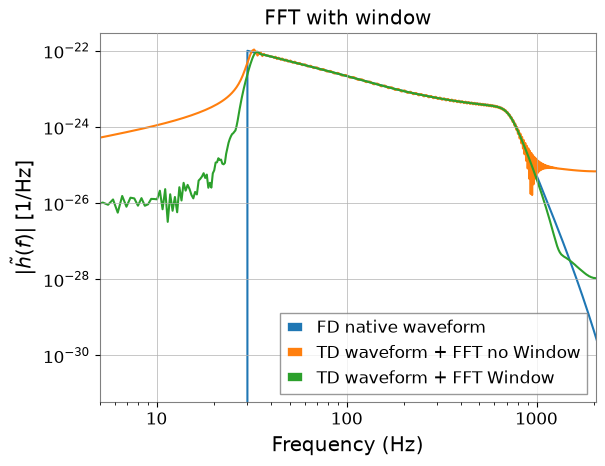

In [164]:
# Apply the real Fast Fourier Transform (rfft)
dt = hp.delta_t
hp_w_fft = dt * np.fft.rfft((window*hp_pad))  
freq_w_fft = np.fft.rfftfreq(len(hp_pad), d=dt)

plt.loglog(hpf.sample_frequencies, np.abs(hpf), label='FD native waveform')
plt.loglog(freq_fft, np.abs(hp_fft), label='TD waveform + FFT no Window')
plt.loglog(freq_w_fft, np.abs(hp_w_fft), label='TD waveform + FFT Window')
plt.xlim(5., fs/2)
plt.xlabel('Frequency (Hz)')
plt.ylabel(r'$|\tilde{h}(f)|$ [1/Hz]')
plt.title("FFT with window")
plt.legend()


We can see that applying the window removes most of the artificial oscillations from the FFT. The windowed time domain waveform now agrees much more closely with the waveform generated directly in the frequency domain

So the strange structure we saw before came from the sharp edges of our finite time series. Hence before Fourier transforming a finite signal we want to taper the edges using a window


### The inverse Discrete Fourier Transform

We can now go back from the frequency domain to the time domain using the inverse FFT

$$
\tilde h(f)\rightarrow h(t)
$$

If everything has been normalised correctly then taking the IFFT of our FFT should recover the original waveform, apart from the window we applied before transforming


In [165]:
# rfft stores non negative frequencies so its outputs has length N/2+1, hence we do this
dt = hp.delta_t
N = (len(hp_w_fft) - 1)*2 
df = 1/(N * dt)
hp_w_ifft = 1./dt * np.fft.irfft(hp_w_fft)


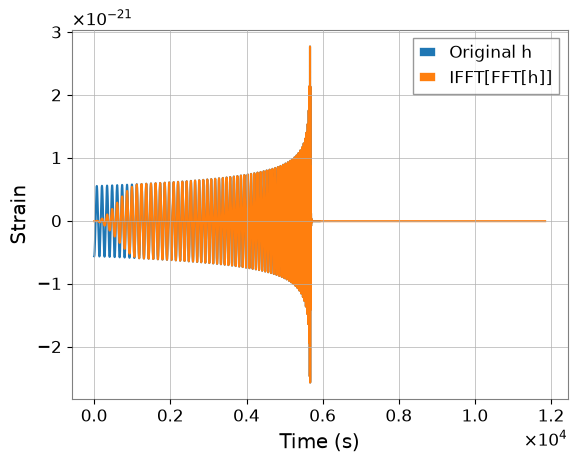

In [166]:
# The IFFT of the signal gives back the original time-domain signal, with the window visible at the beginning.

plt.plot(hp, label='Original h')
plt.plot(hp_w_ifft, label='IFFT[FFT[h]]')
plt.xlabel('Time (s)')
plt.ylabel('Strain')
plt.legend()


We got the original time domain waveform

The difference at the beginning is expected because we applied a Tukey window before taking the FFT, so the reconstructed waveform contains the same taper

Hence

$$
h(t)\rightarrow\tilde h(f)\rightarrow h(t)
$$


## Fourier Transform Conventions

Different packages can use slightly different Fourier transform normalisations, so we need to be careful when moving between them

For the NumPy convention we have used

$$
\tilde d = dt\,\mathrm{FFT}(d)
$$

`GWpy.TimeSeries.fft()` uses a different normalisation with an additional factor of $2df$

PyCBC's `TimeSeries.to_frequencyseries()` follows the same convention we have used here

So in practice it is usually better to use the built in PyCBC or GWpy methods rather than manually keeping track of every prefactor


We can now apply the Fourier transform to real detector data around **GW190412**, we will use $10$ seconds of Livingston data, from $5$ seconds before the event to $5$ seconds after


In [167]:
from gwosc.datasets import event_gps
from gwpy.timeseries import TimeSeries

gps = event_gps('GW190412')
segment = (int(gps)-5, int(gps)+5)
ldata = TimeSeries.fetch_open_data('L1', *segment, verbose=True)


In [168]:
fft = ldata.fft() # ldata is a GWpy timeseries hence we can use this
print(fft)


FrequencySeries([-1.45894410e-21+0.00000000e+00j,
                 -2.91834926e-21-4.52905657e-23j,
                 -2.91973330e-21-9.06202944e-23j, ...,
                 -2.38723982e-23+4.67871178e-26j,
                 -2.38345362e-23+1.80394058e-26j,
                 -2.38457175e-23+0.00000000e+00j],
                unit: dimensionless,
                f0: 0.0 Hz,
                df: 0.1 Hz,
                epoch: 1239082257.0,
                name: L1:GWOSC-4KHZ_R1_STRAIN,
                channel: None)


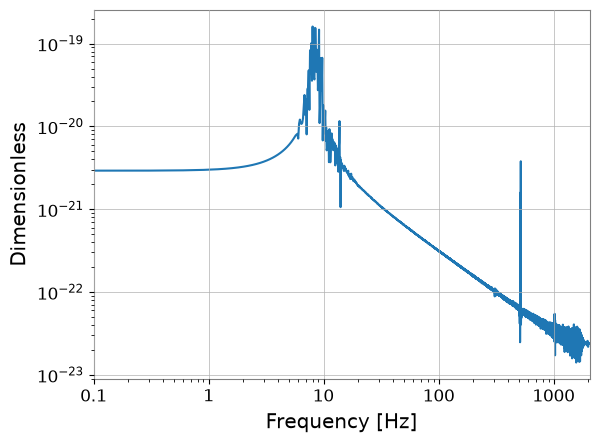

In [169]:
plot = fft.abs().plot(xscale="log", yscale="log")
plot.show(warn=False)


We can see that real detector data is wayyyy more complicated than the clean simulated waveforms

The detector measures

$$
d(t)=s(t)+n(t)
$$

so the frequency domain contains both the gravitational wave signal and detector noise

There are also narrow peaks at particular frequencies caused by features in the detector noise, as before we should window the time domain data before taking the Fourier transform

We again use a Tukey window with $\alpha=0.2$ to smoothly taper the edges towards zero


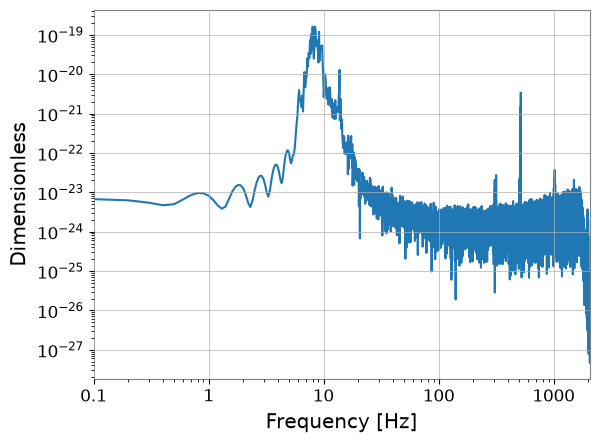

In [170]:
window = scipy.signal.windows.tukey(len(ldata), alpha=0.2)
lwin = ldata * window

#lets transform again

fftamp = lwin.fft().abs()
plot = fftamp.plot(xscale="log", yscale="log")
plot.show(warn=False)


After applying the Tukey window the Fourier transform behaves more nicely because we have removed the sharp discontinuities at the edges of the data

We can now see the frequency dependent structure of the detector noise much more clearly

The detector is not equally sensitive at every frequency, which is why the amplitude changes strongly across the spectrum


### Tutorial 3.2 Noise PSD

## A Few Basics

The **Power Spectral Density**, $S_n(f)$, tells us how the detector noise power is distributed across frequency

For stationary noise we can write

$$
S_n(f)=\lim_{T\rightarrow\infty}\frac{2}{T}
\left\langle|\tilde n_T(f)|^2\right\rangle
$$

So rather than just looking at one noisy Fourier transform, the PSD describes the average noise behaviour at each frequency

The PSD is also related to the noise autocorrelation

$$
\frac{1}{2}S_n(f)=\int d\tau\,e^{-2i\pi f\tau}C_n(\tau)
$$

where $C_n(\tau)=\langle n(t)n(t+\tau)\rangle$

For stationary noise this correlation only depends on the time separation $\tau$, not the absolute time

Stationarity also means that different frequency bins become approximately independent

$$
\frac{2}{T}\left\langle\tilde n_T(f_k)\tilde n_T^*(f_l)\right\rangle
\rightarrow S_n(f_k)\delta_{kl}
$$

So the Fourier transform approximately diagonalises the noise covariance

This is one of the main reasons gravitational wave analysis is very useful in the frequency domain


## An Analytical Model

The detector is not equally noisy at every frequency

At low frequencies there are large contributions from seismic, Newtonian and technical control noise, thermal noise is important through the middle of the sensitive band, while shot noise becomes important at high frequencies

We can make a simple model to see how these combine


In [171]:
# -- Define an array or frequencies
freqs = np.geomspace(10, 2048, 2000)

# -- Make a cartoon model of LIGO noise
controls = 4e-12*(1/freqs**8)
thermal = 3e-23*(1/freqs**0.5)
shot = 3.5e-24*(np.sqrt(1+(freqs/500)**2))
cartoon_asd = np.sqrt(controls**2+shot**2+thermal**2)


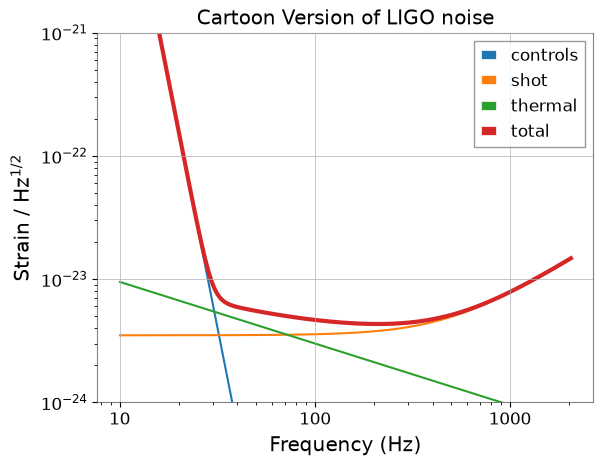

In [172]:
# -- Plot the cartoon model
plt.loglog(freqs, controls, label='controls')
plt.loglog(freqs, shot, label='shot')
plt.loglog(freqs, thermal, label='thermal')
plt.loglog(freqs, cartoon_asd, linewidth=3, label='total')
plt.ylim(1e-24, 1e-21)
plt.title('Cartoon Version of LIGO noise')
plt.ylabel('Strain / Hz$^{1/2}$')
plt.xlabel('Frequency (Hz)')
plt.legend()


We can see that the detector has a **band of best sensitivity** rather than being equally sensitive at every frequency

At low frequencies the control noise rises extremely quickly, while at high frequencies shot noise begins to dominate

This leaves a minimum in between where the detector is most sensitive

The total noise is found by adding the individual noise contributions in quadrature


## Estimating the PSD

A single Fourier transform of detector noise is very noisy because the noise is a random process

So to estimate the PSD we split the data into shorter sections, calculate $|\tilde n(f)|^2$ for each one and then average them

This gets us closer to the ensemble average

$$
S_n(f)\approx\frac{2}{T}\left\langle|\tilde n(f)|^2\right\rangle
$$

The more sections we average, the smoother the estimate becomes, but there is a trade off

Shorter sections mean more averages but worse frequency resolution, whereas longer sections give better frequency resolution but fewer estimates to average


## Amplitude Spectral Density

It is often easier to plot the square root of the PSD, known as the **Amplitude Spectral Density**

$$
\mathrm{ASD}(f)=\sqrt{S_n(f)}
$$

The PSD has units of strain$^2$/Hz, while the ASD has units of strain/$\sqrt{\rm Hz}$


In [173]:
from gwosc.datasets import event_gps
from gwpy.timeseries import TimeSeries


In [174]:
gps = event_gps('GW190412')

segment = (int(gps)-16, int(gps)+16)
ldata = TimeSeries.fetch_open_data('L1', *segment, verbose=True)


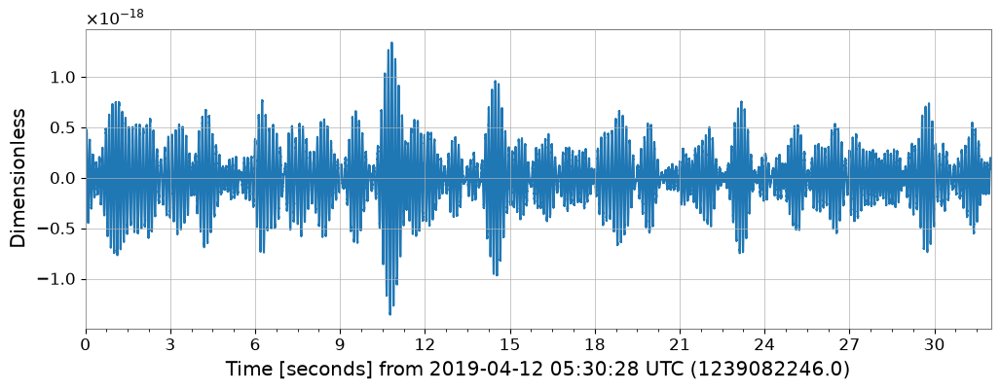

In [175]:
ldata.plot();


In [176]:
T = ldata.duration.value
dt = ldata.dt.value
fs = 1./dt
T, dt, fs


(np.float64(32.0), np.float64(0.000244140625), np.float64(4096.0))

We now have $32$ seconds of Livingston data around GW190412

The data contains the signal as well as noise, but the GW is weak and short compared with the full stretch so its contribution to the PSD estimate is tiny here


In [177]:
freqs_welch, psd_welch = scipy.signal.welch(ldata.value, fs,  window='hann', nperseg=4096)


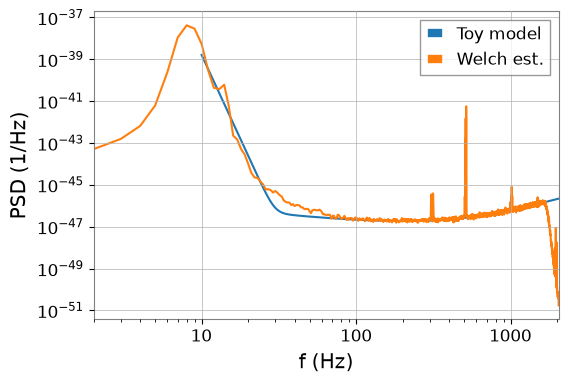

In [178]:
fig, ax = plt.subplots(1,1, figsize=[6,4])
ax.loglog(freqs, cartoon_asd**2, label='Toy model')
ax.loglog(freqs_welch, psd_welch, label='Welch est.')
ax.set_xlim(2., 2048.)
ax.set_xlabel(r'f (Hz)')
ax.set_ylabel(r'PSD (1/Hz)')
ax.legend()


This is the PSD estimate from Welch's method

We split the data into overlapping windowed sections, calculate the Fourier power from each and average them

$$
\text{data}\rightarrow\text{windowed sections}\rightarrow|\tilde n(f)|^2\rightarrow\text{average}
$$


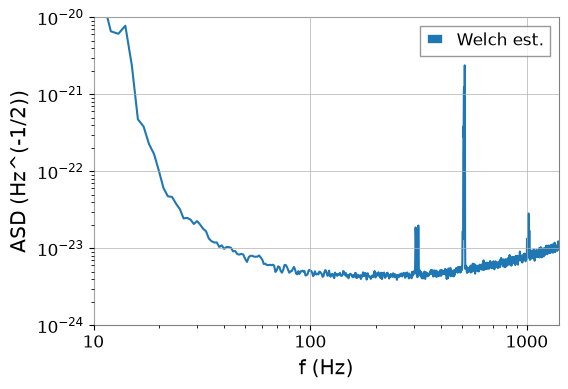

In [179]:
fig, ax = plt.subplots(1,1, figsize=[6,4])
ax.loglog(freqs_welch[1:], np.sqrt(psd_welch[1:]), label='Welch est.')
ax.set_xlim(10, 1400)
ax.set_ylim(1e-24, 1e-20)
ax.set_xlabel(r'f (Hz)')
ax.set_ylabel(r'ASD (Hz^(-1/2))')
ax.legend()


The ASD is the standard way we usually look at detector sensitivity

We can see narrow spectral lines around particular frequencies sitting on top of the broader detector noise

So the noise is definitely not just one smooth flat background


## Effect of Segment Length

Now we can actually see the trade off from before

Longer segments give smaller $\Delta f=1/T$ so individual spectral features are resolved more sharply, but we have fewer segments to average

Shorter segments do the opposite


In [180]:
freqs_welch_shortseg, psd_welch_shortseg = scipy.signal.welch(ldata.value, fs,  window='hann', nperseg=1024)
freqs_welch_longseg, psd_welch_longseg = scipy.signal.welch(ldata.value, fs,  window='hann', nperseg=8192)


In [181]:
freqs_welch_shortseg.shape, freqs_welch_longseg.shape


((513,), (4097,))

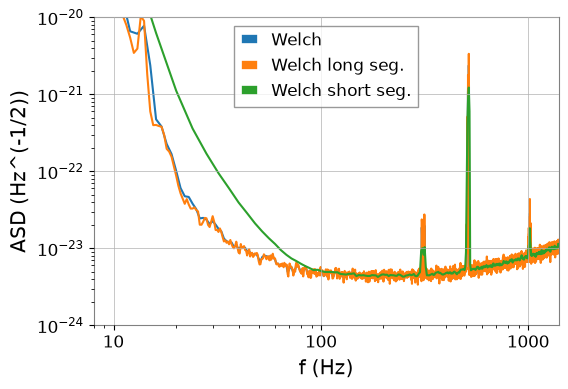

In [182]:
fig, ax = plt.subplots(1,1, figsize=[6,4])
ax.loglog(freqs_welch, np.sqrt(psd_welch), label='Welch')
ax.loglog(freqs_welch_longseg, np.sqrt(psd_welch_longseg), label='Welch long seg.')
ax.loglog(freqs_welch_shortseg, np.sqrt(psd_welch_shortseg), label='Welch short seg.')
ax.set_xlim(8., 1400.)
ax.set_ylim(1e-24, 1e-20)
ax.set_xlabel(r'f (Hz)')
ax.set_ylabel(r'ASD (Hz^(-1/2))')
ax.legend()


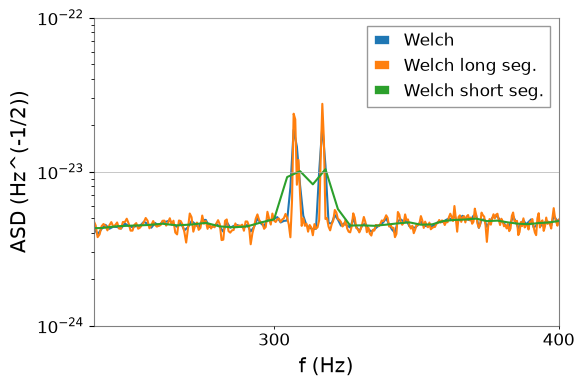

In [183]:
fig, ax = plt.subplots(1,1, figsize=[6,4])
ax.loglog(freqs_welch, np.sqrt(psd_welch), label='Welch')
ax.loglog(freqs_welch_longseg, np.sqrt(psd_welch_longseg), label='Welch long seg.')
ax.loglog(freqs_welch_shortseg, np.sqrt(psd_welch_shortseg), label='Welch short seg.')
ax.set_xlim(250., 400.)
ax.set_ylim(1e-24, 1e-22)
ax.set_xlabel(r'f (Hz)')
ax.set_ylabel(r'ASD (Hz^(-1/2))')
ax.legend()


The zoom makes it clearer, the longer segments resolve the narrow structure better while the shorter segment estimate is smoother

So there is no single perfect segment length, it depends on whether we care more about frequency resolution or reducing variance


## Using More Data

We can also increase the total amount of data while keeping the FFT segment length fixed

We now take $512$ seconds either side of GW190412, giving $1024$ seconds in total

This gives us many more estimates to average, although over very long stretches the assumption that the detector noise is stationary can become worse


In [184]:
gps = event_gps('GW190412')

segment = (int(gps)-512, int(gps)+512)
ldata2 = TimeSeries.fetch_open_data('L1', *segment, verbose=True)


In [185]:
freqs_welch_longdata, psd_welch_longdata = scipy.signal.welch(ldata2.value, fs,  window='hann', nperseg=4096)


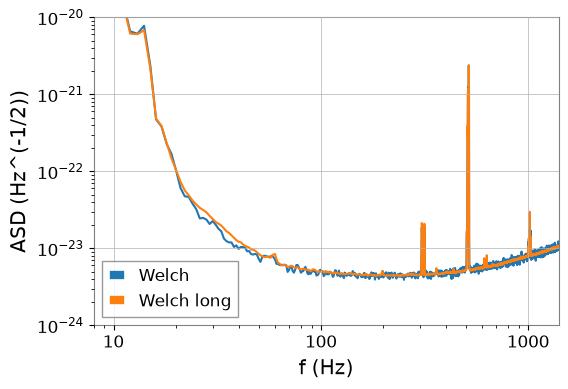

In [186]:
fig, ax = plt.subplots(1,1, figsize=[6,4])
ax.loglog(freqs_welch, np.sqrt(psd_welch), label='Welch')
ax.loglog(freqs_welch_longdata, np.sqrt(psd_welch_longdata), label='Welch long')
ax.set_xlim(8., 1400.)
ax.set_ylim(1e-24, 1e-20)
ax.set_xlabel(r'f (Hz)')
ax.set_ylabel(r'ASD (Hz^(-1/2))')
ax.legend()


We can see that the much longer stretch gives a smoother estimate because random fluctuations average out more strongly

We can also pick out features such as the small bump around $60$ Hz from the US electrical mains


## GWpy and PyCBC Interface

We do not normally need to calculate all of the PSD averaging manually

GWpy can estimate the ASD with either Welch averaging or the median, while PyCBC has its own PSD interface

The median is useful because it is less affected by an unusually loud disturbance in one section


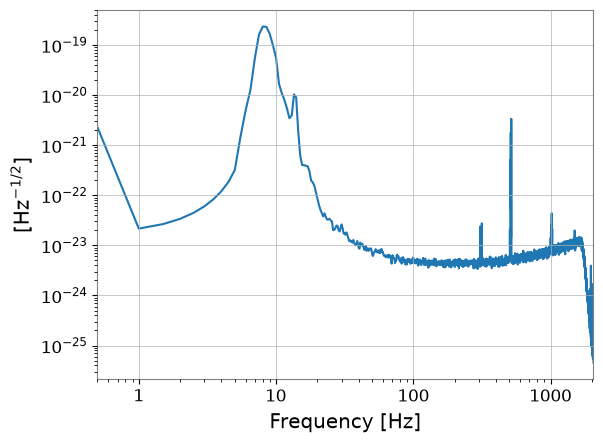

In [187]:
asd_gwpy_welch = ldata.asd(fftlength=2, method="welch")
asd_gwpy_median = ldata.asd(fftlength=2, method="median")
plot = asd_gwpy_welch.plot()
plot.show(warn=False)


In [188]:
from pycbc.frame.gwosc import read_strain_gwosc

ldata_pycbc = read_strain_gwosc('L1', *segment)


In [189]:
# If the cell above is slow, comment it and use the following lines

#from gwosc.locate import get_urls
#from pycbc.frame import read_frame
#import os
#URL = get_urls("L1", *segment, format='gwf')[1]
#file = os.path.basename(URL)
#print(URL, file)
#if not os.path.exists(file):
#    ! wget $URL
#ldata_pycbc = read_frame(file, "L1:GWOSC-4KHZ_R1_STRAIN", start_time=segment[0], end_time=segment[1])


In [190]:
fftlength = 2.
psd_pycbc = ldata_pycbc.psd(fftlength)


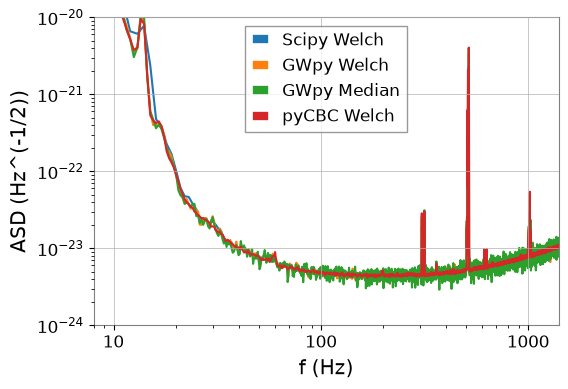

In [191]:
fig, ax = plt.subplots(1,1, figsize=[6,4])
ax.loglog(freqs_welch[1:], np.sqrt(psd_welch[1:]), label='Scipy Welch')
ax.loglog(asd_gwpy_welch.frequencies.value, asd_gwpy_welch.value, label='GWpy Welch')
ax.loglog(asd_gwpy_welch.frequencies.value, asd_gwpy_median.value, label='GWpy Median')
ax.loglog(psd_pycbc.get_sample_frequencies().data, np.sqrt(psd_pycbc.data), label='pyCBC Welch')
ax.set_xlim(8., 1400.)
ax.set_ylim(1e-24, 1e-20)
ax.set_xlabel(r'f (Hz)')
ax.set_ylabel(r'ASD (Hz^(-1/2))')
ax.legend()


The different implementations agree closely, so the important bit is the method rather than which package we use

The median and mean based estimates differ slightly because they combine the individual periodograms differently


## PSDs of Three Detectors

We can compare Livingston, Hanford and Virgo directly using the same method


In [192]:
# get Livingston data if not done before
# ldata2 = TimeSeries.fetch_open_data('L1', int(gps)-512, int(gps)+512, cache=True)
lasd2 = ldata2.asd(fftlength=4, method="median")

# get Hanford data
hdata2 = TimeSeries.fetch_open_data('H1', int(gps)-512, int(gps)+512, cache=True)
hasd2 = hdata2.asd(fftlength=4, method="median")

# get Virgo data
vdata2 = TimeSeries.fetch_open_data('V1', int(gps)-512, int(gps)+512, cache=True)
vasd2 = vdata2.asd(fftlength=4, method="median")


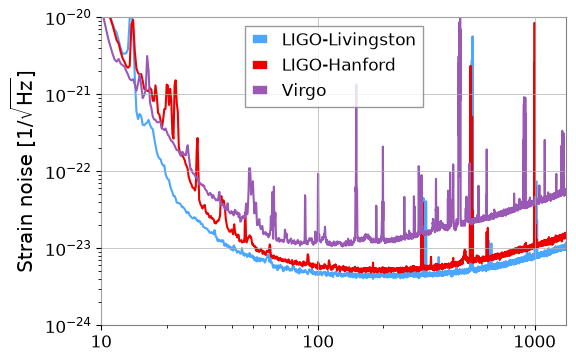

In [193]:
fig, ax = plt.subplots(1,1, figsize=[6,4])

# and plot using standard colours
ax.loglog(lasd2, label='LIGO-Livingston', color='gwpy:ligo-livingston')
ax.loglog(hasd2, label='LIGO-Hanford', color='gwpy:ligo-hanford')
ax.loglog(vasd2, label='Virgo', color='gwpy:virgo')

ax.set_xlim(10, 1400)
ax.set_ylim(1e-24, 1e-20)
ax.set_ylabel(r'Strain noise [$1/\sqrt{\mathrm{Hz}}$]')
ax.legend()


We can see that all three detectors have the same broad low and high frequency behaviour, but their exact sensitivity and spectral lines are different

So every detector needs its own noise model


# Whitening and Band Passing Real Data

We now move to GW150914 and use the PSD to make the useful part of the signal much easier to interpret


In [194]:
from gwosc.datasets import event_gps
from gwpy.timeseries import TimeSeries


In [195]:
gps = event_gps('GW150914')
segment = (int(gps)-4, int(gps)+4)
hdata = TimeSeries.fetch_open_data('H1', *segment, verbose=True)


This time we use $8$ seconds of **Hanford** data around GW150914

First we window the time series, transform it and estimate its ASD from the same stretch of detector data


In [196]:
T = hdata.shape[0] * hdata.dt.value
dt = hdata.dt.value
N = hdata.shape[0]
T, N, dt


(np.float64(8.0), 32768, np.float64(0.000244140625))

In [197]:
w = scipy.signal.windows.tukey(hdata.shape[0], 0.1)
hdata_w = w * hdata
hdata_fd = hdata_w.fft() / (2/T)

asd = hdata.asd(fftlength=1., method="welch")


In [198]:
hdata_fd.df.value, 1./T


(np.float64(0.125), np.float64(0.125))

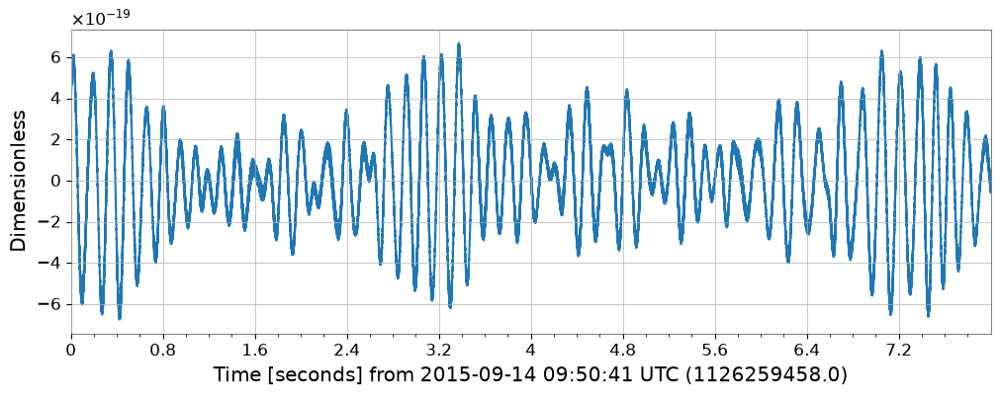

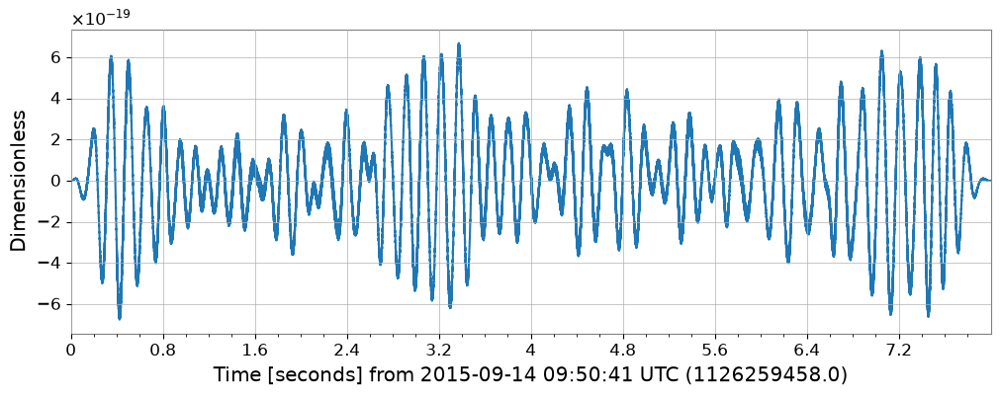

In [199]:
hdata.plot();
hdata_w.plot();


## Correspondence Between the Data and PSD

For stationary Gaussian noise the real and imaginary parts of each Fourier bin are independent Gaussian variables

$$
\mathrm{Re}(\tilde n_j),\ \mathrm{Im}(\tilde n_j)
\sim
\mathcal N\left(0,\frac{S_n(f_j)}{4\Delta f}\right)
$$

Hence

$$
\left\langle|\tilde n_j|^2\right\rangle=\frac{S_n(f_j)}{2\Delta f}
$$

So the ASD tells us the typical Fourier amplitude we expect from the detector noise at each frequency


(1e-24, 1e-20)

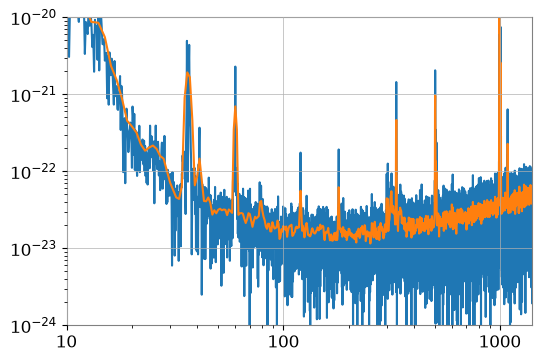

In [200]:
fig, ax = plt.subplots(1,1, figsize=[6,4])
ax.loglog(hdata_fd.frequencies.value[1:], np.abs(hdata_fd.value[1:]))
ax.loglog(asd.frequencies.value[1:], asd.value[1:] / np.sqrt(2*hdata_fd.df.value))
ax.set_xlim(10, 1400)
ax.set_ylim(1e-24, 1e-20)


## Whitening and Band Passing

The detector noise is not flat, so we whiten by rescaling each Fourier bin using the PSD

$$
\tilde d_j^{\rm w}
=
\sqrt{\frac{2\Delta f}{S_n(f_j)}}\tilde d_j
$$

Noisy frequencies therefore get suppressed more strongly while quieter frequencies count more

We also do not need every frequency, so we band pass the useful region

$$
\tilde d_j^{\rm wbp}(f)=\tilde w_{\rm bp}(f)\tilde d_j^{\rm w}(f)
$$

For GW150914 we target roughly $20$-$400$ Hz, tapering smoothly from $10$-$20$ Hz and $400$-$500$ Hz so we do not create another sharp edge


In [201]:
# Definitions for the windowing function -- function for vectorial argument
# Similar to the Tukey window: tapering to 0 with a cosine on each end. This interface is flexible, in order to allow for asymmetric tapering width at each end. 
def window_tukey(x, xi, xf, deltaxi, deltaxf):
    '''
    Window function based on Tukey, with unequal tapering lengths at the beginning and end.
    Zero outside of [xi,xf], one on [xi+deltaxi, xf-deltaxf], tapering smoothly from 0 to 1 on [xi,xi+deltaxi] and from 1 to 0 on [xf-deltaxf,xf]
    '''
    w = np.zeros(len(x), dtype=float)
    #
    mask = (x <= xi) | (x >= xf)
    w[mask] = 0.
    #
    mask = (xi < x) & (x < xi + deltaxi)
    w[mask] = (1. - np.cos((x[mask] - xi) / deltaxi * np.pi)) / 2
    #
    mask = (xi + deltaxi <= x) & (x <= xf - deltaxf)
    w[mask] = 1.
    #
    mask = (xf - deltaxf < x) & (x < xf)
    w[mask] = (1. + np.cos((x[mask] - xf - deltaxf) / deltaxf * np.pi)) / 2
    #
    return w


In [202]:
freq = hdata_fd.frequencies.value
df = hdata_fd.df.value

asd_interp = scipy.interpolate.interp1d(asd.frequencies.value, asd.value)

window_bp = window_tukey(freq, 10., 500., 10., 100.)

hdata_wbp = window_bp * hdata_fd.value / (asd_interp(freq) / np.sqrt(2*df))


Text(0.5, 0, 'f (Hz)')

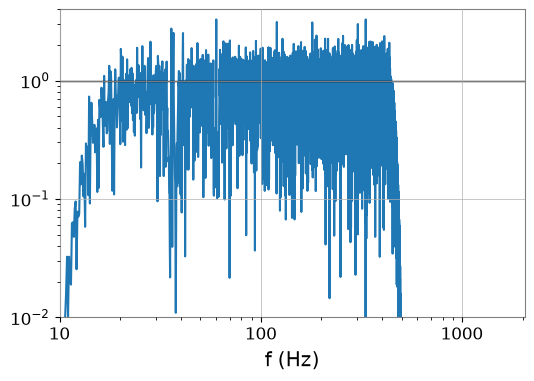

In [203]:
fig, ax = plt.subplots(1,1, figsize=[6,4])
ax.loglog(freq, np.abs(hdata_wbp))
ax.set_xlim(10, 2048)
ax.set_ylim(1e-2, 4)
ax.axhline(1., c='k', lw=1.)
ax.set_xlabel('f (Hz)')


We can see that the broad frequency dependence has basically gone after whitening

Inside the pass band the noise amplitude now sits around the same scale, while the very low and very high frequencies have been removed


## Whitened Band Passed Signal in the Time Domain

White noise is independent with the same variance across the useful bins, so after the inverse transform the time series becomes much easier to read visually


In [204]:
hdata_wbp_td = df * np.fft.irfft(hdata_wbp)

times = dt * np.arange(len(hdata_wbp_td))


Text(0, 0.5, 'Whitened band-passed strain')

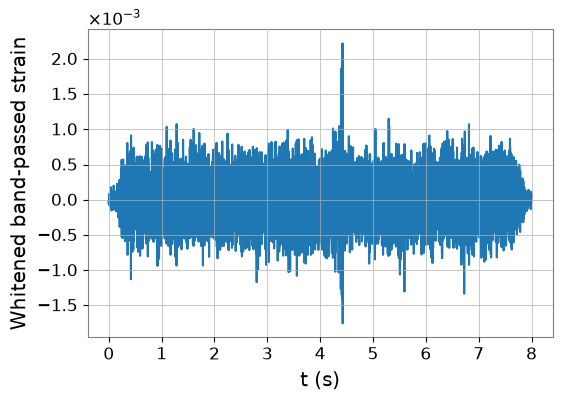

In [205]:
fig, ax = plt.subplots(1,1, figsize=[6,4])
ax.plot(times, hdata_wbp_td)
ax.set_xlabel('t (s)')
ax.set_ylabel('Whitened band-passed strain')


Text(0, 0.5, 'Whitened band-passed strain')

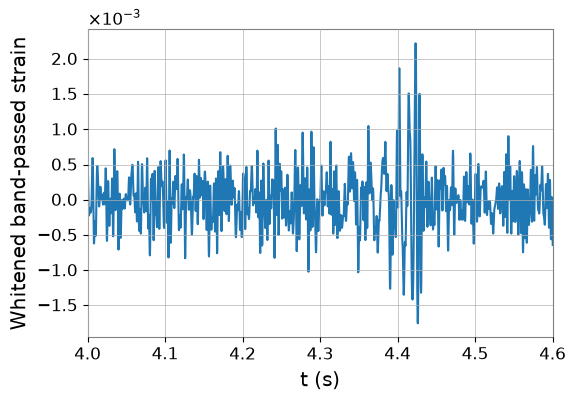

In [206]:
fig, ax = plt.subplots(1,1, figsize=[6,4])
ax.plot(times, hdata_wbp_td)
ax.set_xlim(4, 4.6)
ax.set_xlabel('t (s)')
ax.set_ylabel('Whitened band-passed strain')


Now the short GW150914 chirp stands out much more clearly around the merger

So the main chain is

$$
\text{raw strain}\rightarrow\text{estimate PSD}\rightarrow\text{whiten}\rightarrow\text{band pass}
$$

This frequency dependent weighting is also exactly the intuition we will need for matched filtering


## O1 vs O3 Sensitivity

We can compare Livingston around GW150914 in O1 with Livingston around GW190412 in O3 at $100$ Hz

The improvement factor is

$$
\frac{\mathrm{ASD}_{\rm O1}(100\,\mathrm{Hz})}{\mathrm{ASD}_{\rm O3}(100\,\mathrm{Hz})}
$$

So a value of $2$ would mean the strain noise at $100$ Hz became about two times smaller


In [207]:

# Livingston around GW150914 (O1)
gps_o1 = event_gps('GW150914')
ldata_o1 = TimeSeries.fetch_open_data('L1', int(gps_o1)-512, int(gps_o1)+512, cache=True)
asd_o1 = ldata_o1.asd(fftlength=4, method='median')

# lasd2 is Livingston around GW190412 (O3) from above
f_compare = 100.0
asd_o1_100 = np.interp(f_compare, asd_o1.frequencies.value, asd_o1.value)
asd_o3_100 = np.interp(f_compare, lasd2.frequencies.value, lasd2.value)
improvement = asd_o1_100 / asd_o3_100

print('O1 ASD at 100 Hz:', asd_o1_100)
print('O3 ASD at 100 Hz:', asd_o3_100)
print('Sensitivity improvement factor:', improvement)


O1 ASD at 100 Hz: 9.977423609495465e-24
O3 ASD at 100 Hz: 4.8162822730473885e-24
Sensitivity improvement factor: 2.0716027516349214


The number printed above is the useful answer, the larger it is the more the detector improved in amplitude sensitivity between O1 and O3


### Is the Whitened Data Gaussian?

If the whitening has worked, the real and imaginary parts of the Fourier bins inside the flat part of the pass band should look Gaussian

With the normalisation used here we expect each component to have

$$
\sigma\simeq\frac{1}{\sqrt{2}}
$$


std(Re) = 0.6654350840564581
std(Im) = 0.6700619301237337
expected = 0.7071067811865475


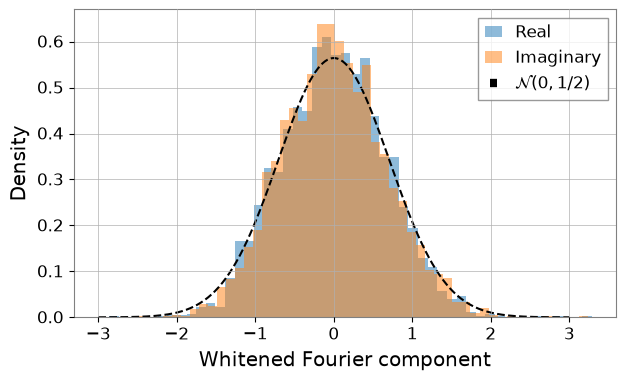

In [208]:

# Keep only the flat part of the pass band, avoiding the tapered edges
mask_flat = (freq >= 20) & (freq <= 400) & (window_bp == 1)

real_white = np.real(hdata_wbp[mask_flat])
imag_white = np.imag(hdata_wbp[mask_flat])

print('std(Re) =', np.std(real_white))
print('std(Im) =', np.std(imag_white))
print('expected =', 1/np.sqrt(2))

fig, ax = plt.subplots(1, 1, figsize=(7, 4))
ax.hist(real_white, bins=50, density=True, alpha=0.5, label='Real')
ax.hist(imag_white, bins=50, density=True, alpha=0.5, label='Imaginary')

x = np.linspace(-3, 3, 400)
sigma = 1/np.sqrt(2)
gaussian = np.exp(-x**2/(2*sigma**2)) / (np.sqrt(2*np.pi)*sigma)
ax.plot(x, gaussian, 'k--', label=r'$\mathcal{N}(0,1/2)$')

ax.set_xlabel('Whitened Fourier component')
ax.set_ylabel('Density')
ax.legend()
plt.show()


If the histograms roughly follow the Gaussian curve and both standard deviations are close to $1/\sqrt{2}\approx0.707$, then the whitening is behaving how we expect

They will not be absolutely perfect because real detector data is not perfectly stationary Gaussian noise


## Summaryish

- The PSD $S_n(f)$ tells us how detector noise power changes with frequency and the ASD is $\sqrt{S_n(f)}$
- Welch's method reduces the huge fluctuations of one periodogram by averaging windowed Fourier estimates
- Longer FFT segments improve frequency resolution but reduce the amount of averaging, while using more total data gives more averaging but risks including non stationary behaviour
- Whitening rescales the Fourier bins by their expected noise and band passing removes frequencies we do not want
- So the PSD is not just a plot of detector noise, it tells us how strongly different frequencies should count in the analysis


### Tutorial 3.3 Spectrograms and Q Transforms

## Time Frequency Analysis

A normal Fourier transform tells us what frequencies are present but loses the information about when they occur

For gravitational waves this is a problem because the frequency changes throughout the signal

So instead we want to see how the frequency content changes with time


## Spectrograms

A spectrogram takes Fourier transforms of short chunks of the data and stacks them in time

So instead of one spectrum we get power as a function of both time and frequency

Shorter chunks give better time resolution but worse frequency resolution, while longer chunks do the opposite


In [209]:
# The first import of gwpy can take some time (especially on cloud platforms).
# This is mainly due to matplotlib taking some time to import (this is normal).
import gwpy


In [210]:
from gwosc.datasets import event_gps
from gwpy.timeseries import TimeSeries

gps = event_gps('GW170817')
print("GW170817 GPS:", gps)

ldata = TimeSeries.fetch_open_data('L1', int(gps)-512, int(gps)+512, cache=True)
print("GW170817 data")
print(ldata)


GW170817 GPS: 1187008882.4
GW170817 data
TimeSeries([2.06056010e-20, 1.59181918e-20, 2.18438811e-20, ...,
            1.25504332e-19, 1.23976846e-19, 1.22231459e-19],
           unit: dimensionless,
           t0: 1187008370.0 s,
           dt: 0.000244140625 s,
           name: L1:Strain,
           channel: None)


We start with about $17$ minutes of Livingston data around GW170817 so we can look at how the detector noise changes over a reasonably long stretch of time


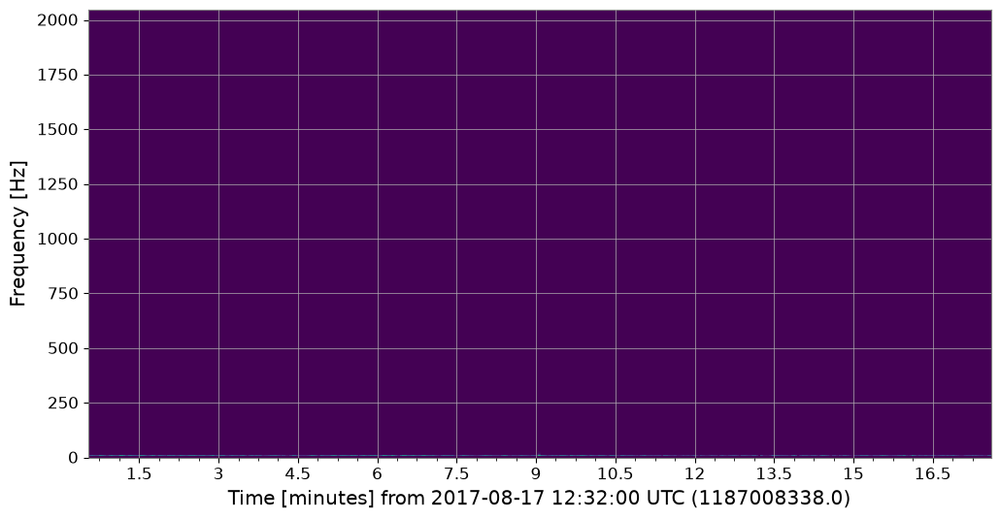

In [211]:
specgram = ldata.spectrogram2(fftlength=4, overlap=2, window='hann') ** (1/2.)
plot = specgram.plot()


The first plot is basically dark because the ASD spans several orders of magnitude, so a linear colour scale is not very useful here


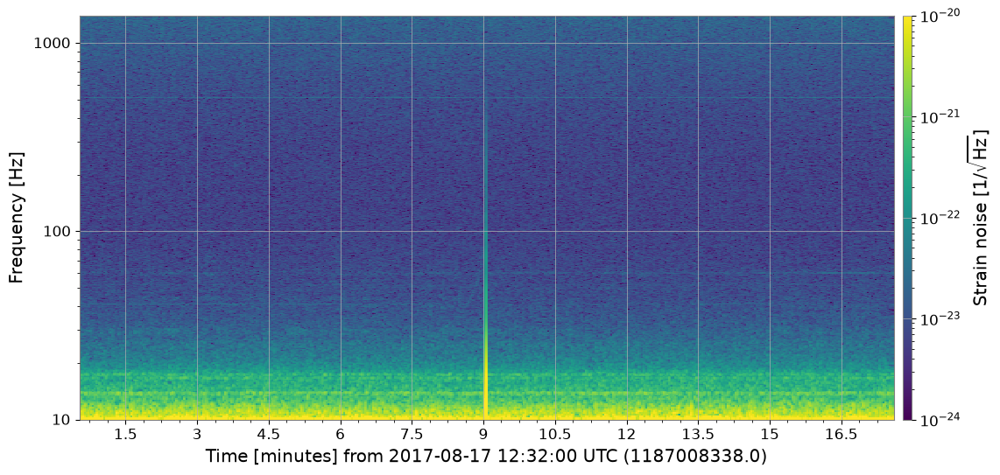

In [212]:
ax = plot.gca()
ax.set_yscale('log')
ax.set_ylim(10, 1400)
ax.colorbar(
    clim=(1e-24, 1e-20),
    norm="log",
    label=r"Strain noise [$1/\sqrt{\mathrm{Hz}}$]",
)
plot  # refresh


Now we can actually see the structure

Below around $30$ Hz the noise changes quite a lot with time, while above around $100$ Hz it is much more stable

Between them there are narrow features appearing and disappearing, so this is a nice direct picture of **non stationary noise**


## Spectrogram Challenge

First we can compare the PSDs of all three detectors around GW170814


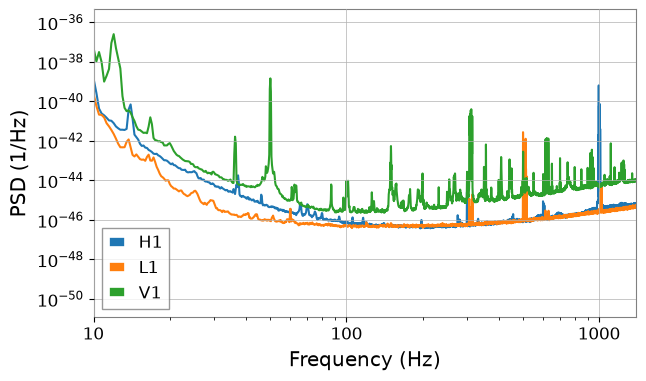

In [213]:

gps_170814 = event_gps('GW170814')
segment_170814 = (int(gps_170814)-512, int(gps_170814)+512)

psds_170814 = {}
for ifo in ['H1', 'L1', 'V1']:
    data = TimeSeries.fetch_open_data(ifo, *segment_170814, cache=True)
    psds_170814[ifo] = data.psd(fftlength=4, method='median')

fig, ax = plt.subplots(1, 1, figsize=(7, 4))
for ifo, psd in psds_170814.items():
    ax.loglog(psd.frequencies.value, psd.value, label=ifo)

ax.set_xlim(10, 1400)
ax.set_xlabel('Frequency (Hz)')
ax.set_ylabel('PSD (1/Hz)')
ax.legend()
plt.show()


And now a $10$ minute Livingston spectrogram around GW170817


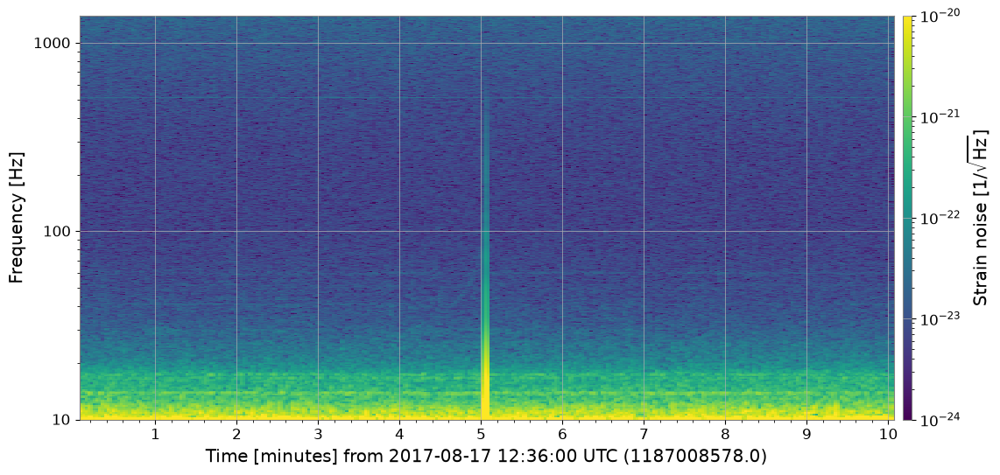

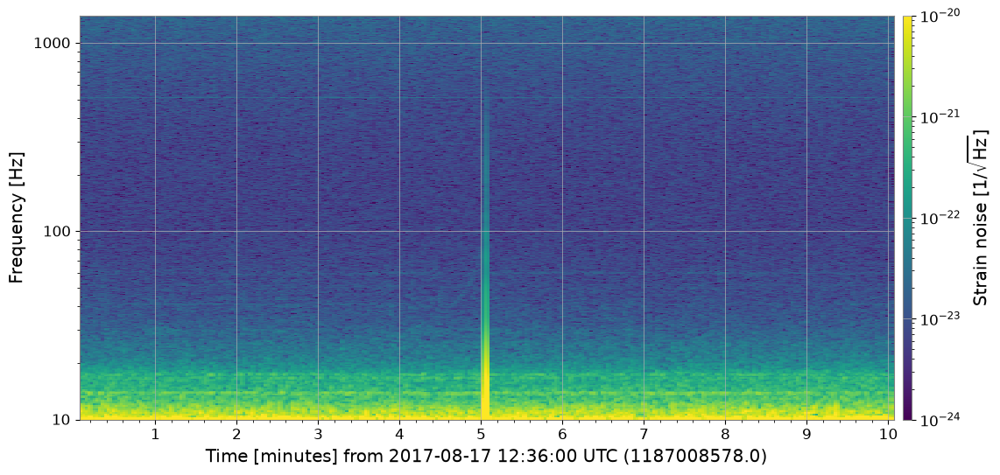

In [214]:

segment_10min = (int(gps)-300, int(gps)+300)
ldata_10min = TimeSeries.fetch_open_data('L1', *segment_10min, cache=True)

specgram_10min = ldata_10min.spectrogram2(fftlength=4, overlap=2, window='hann') ** (1/2.)
plot = specgram_10min.plot()
ax = plot.gca()
ax.set_yscale('log')
ax.set_ylim(10, 1400)
ax.colorbar(
    clim=(1e-24, 1e-20),
    norm='log',
    label=r'Strain noise [$1/\sqrt{\mathrm{Hz}}$]',
)
plot


The point of this plot is not really the GW170817 chirp itself, it is to see how the detector sensitivity and noise features move around over minutes


## Q Transforms

A fixed spectrogram window is good for long term detector behaviour, but short transients need a more flexible time frequency representation

The Q transform uses tiles with different time and frequency resolution

A useful way to think about it is

$$
Q\sim\frac{f}{\Delta f}
$$

so a high $Q$ is narrow in frequency and extended in time, while a lower $Q$ gives better time localisation


In [215]:
segment = (int(gps) - 30, int(gps) + 2)
hdata = TimeSeries.fetch_open_data('H1', *segment, verbose=True, cache=True)


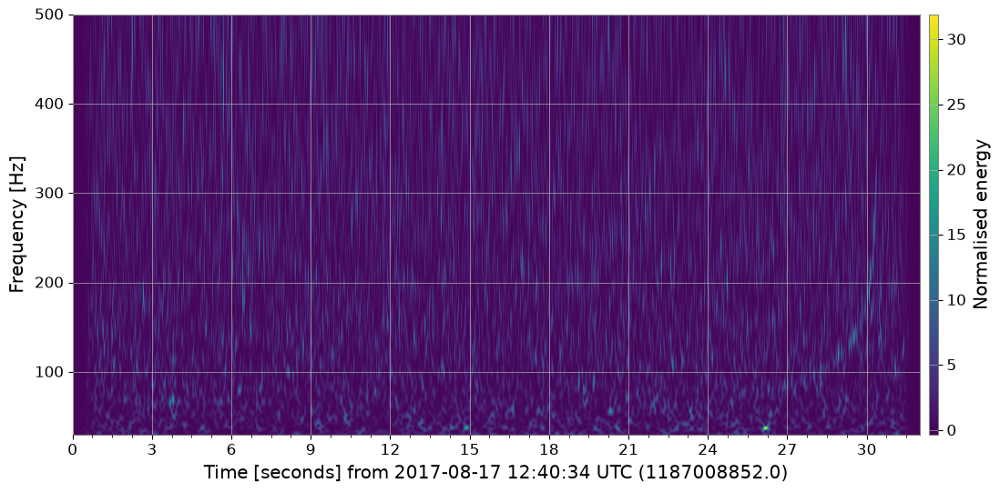

In [216]:
hq = hdata.q_transform(frange=(30, 500))
plot = hq.plot()
plot.colorbar(label="Normalised energy")


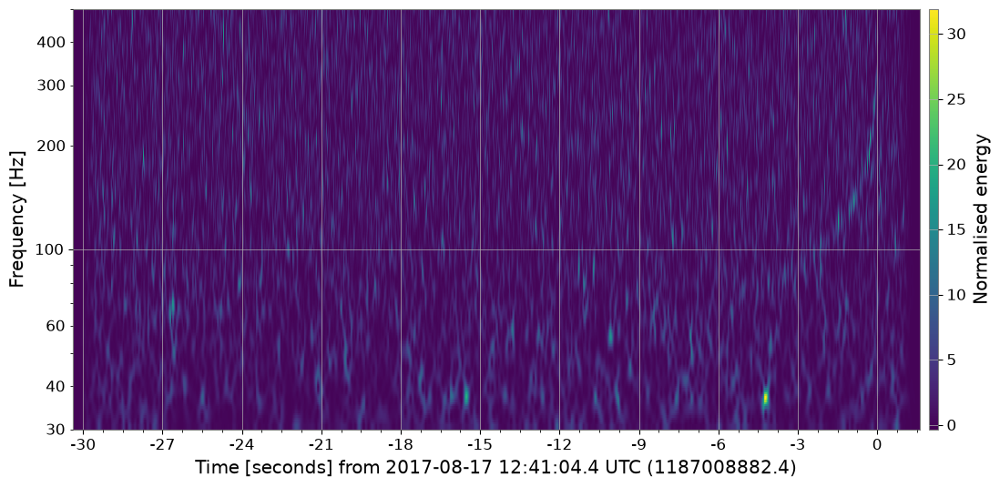

In [217]:
ax = plot.gca()
ax.set_epoch(gps)
ax.set_ylim(30, 500)
ax.set_yscale("log")
plot  # refresh


The colour now represents **normalised energy** rather than the raw ASD, so short features stand out much more clearly

We can already see something chirp like approaching $t=0$


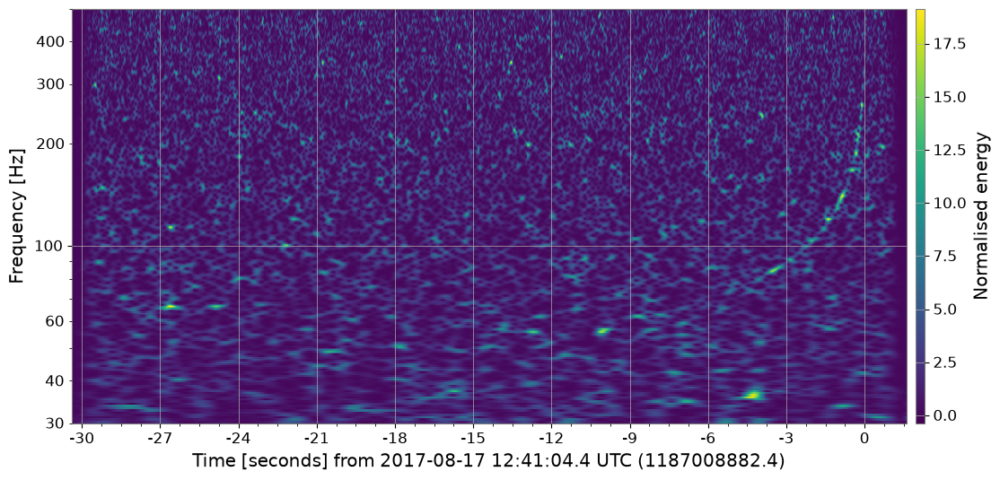

In [218]:
hq = hdata.q_transform(frange=(30, 500), qrange=(100, 110))
plot = hq.plot()
ax = plot.gca()
ax.set_epoch(gps)
ax.set_yscale('log')
ax.colorbar(label="Normalised energy")


Restricting the Q range makes the BNS track much clearer

We can see the frequency increasing towards merger, exactly what we expect as the neutron stars inspiral faster and faster


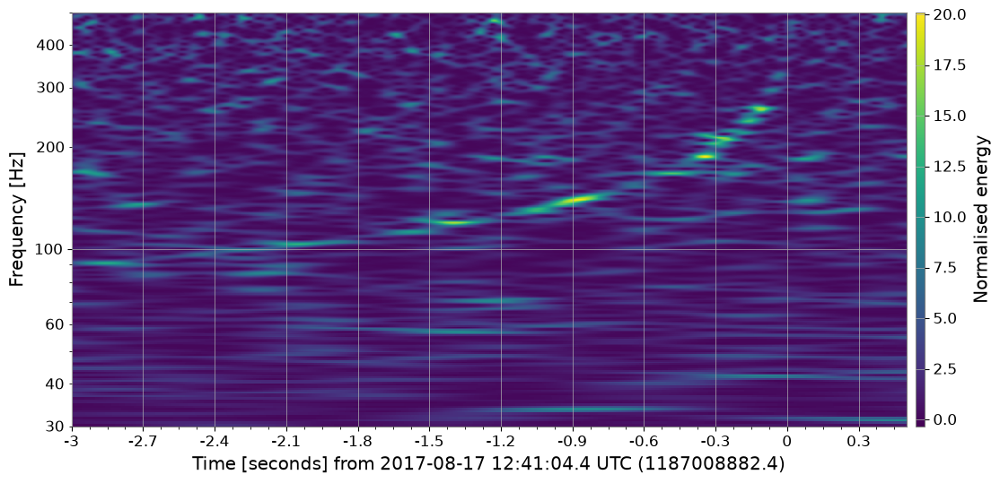

In [219]:
#-- Use OUTSEG for small time range
hq2 = hdata.q_transform(frange=(30, 500), qrange=(80, 110), outseg=(gps-3,gps+0.5)) 
plot = hq2.plot()
ax = plot.gca()
ax.set_epoch(gps)
ax.set_yscale('log')
ax.colorbar(label="Normalised energy")


`outseg` just lets us calculate and display a much smaller region around the merger without changing the full input data


## Livingston and the GW170817 Glitch

We can now do the same thing with Livingston


In [220]:
ldata = TimeSeries.fetch_open_data('L1', *segment, verbose=True)


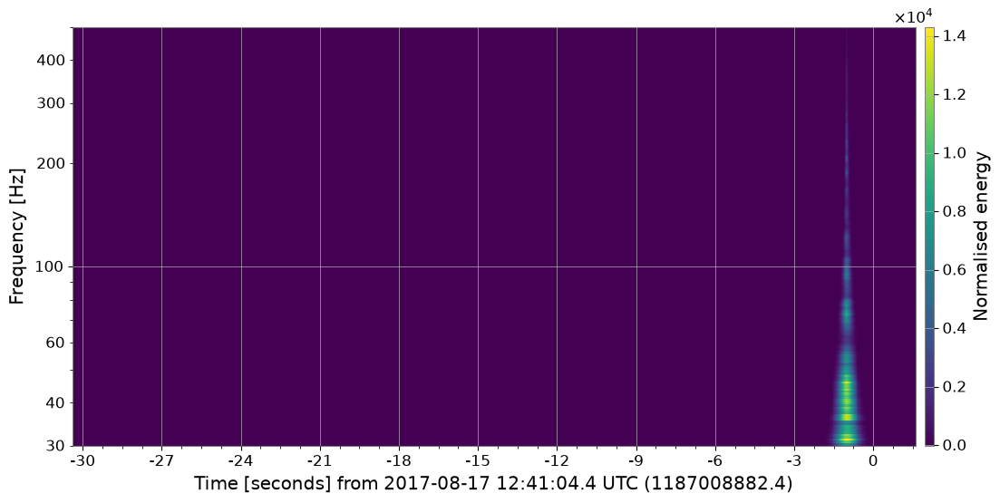

In [221]:
lq = ldata.q_transform(frange=(30, 500), qrange=(100, 110))
plot = lq.plot()
ax = plot.gca()
ax.set_epoch(gps)
ax.set_yscale('log')
ax.colorbar(label="Normalised energy")


There is a huge blob very close to the merger, around $1000$ times louder in energy than the corresponding Hanford feature

This is an instrumental glitch which almost overlaps the real BNS signal


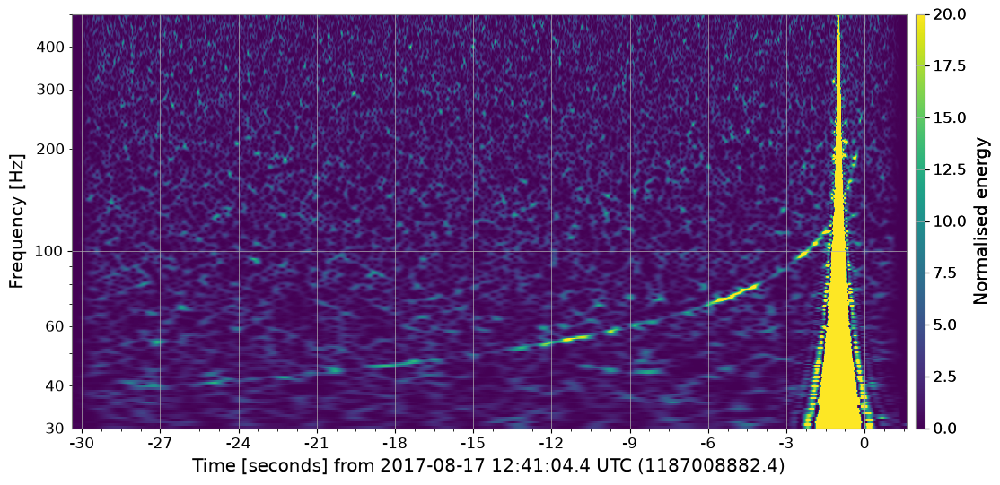

In [223]:
ax = plot.gca()
ax.set_epoch(gps)
ax.set_yscale('log')

ax.colorbar(
    clim=(0, 20),
    label="Normalised energy"
)

plot


Rescaling the colour bar lets us see the weaker astrophysical chirp underneath the glitch, extending much further back in time


## Gating

A very loud glitch can interfere with the analysis, so we can **gate** the short contaminated region

The data is smoothly taken to zero around the glitch rather than being cut sharply, otherwise we would just introduce another discontinuity


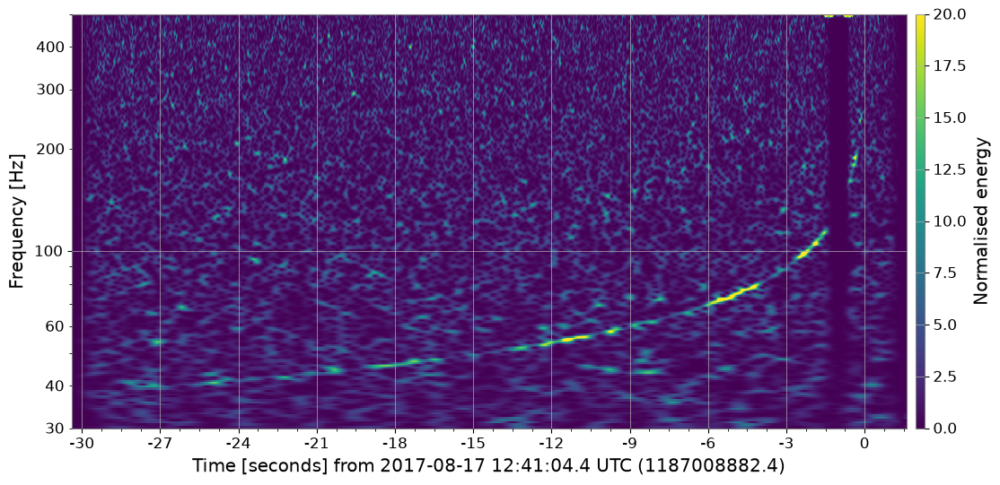

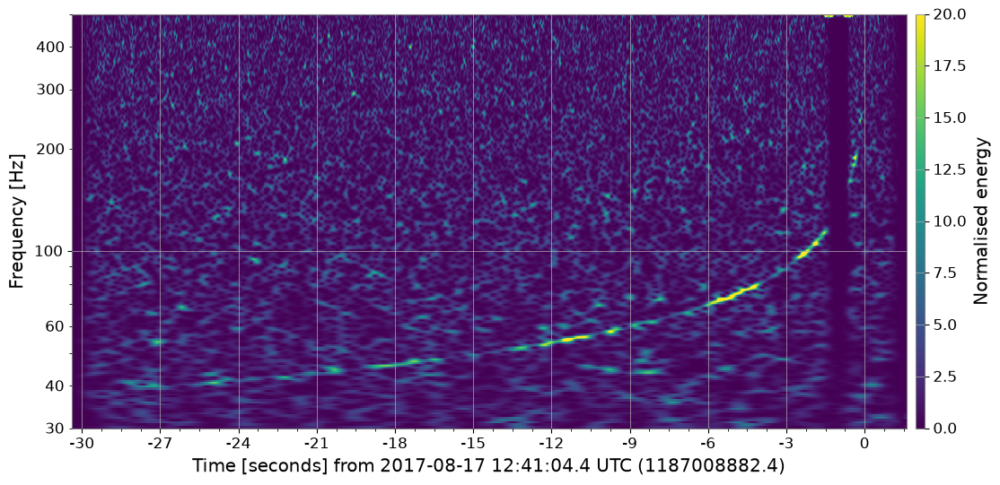

In [225]:
gated_ldata = ldata.gate(tzero=0.25, tpad=0.25)

gated_lq = gated_ldata.q_transform(
    frange=(30, 500),
    qrange=(100, 110)
)

plot = gated_lq.plot()

ax = plot.gca()
ax.set_epoch(gps)
ax.set_yscale('log')

# Add the colourbar and set its range directly
ax.colorbar(
    clim=(0, 20),
    label="Normalised energy"
)

plot


The chirp is easier to see after gating, but we have also deliberately thrown away some real data

So gating is useful for very loud glitches but we only want to use it when we actually need it


## Q Transforms in PyCBC

PyCBC can calculate the same type of time frequency representation


In [226]:
from pycbc.frame.gwosc import read_strain_gwosc

ldata = read_strain_gwosc('L1', *segment)


In [ ]:
# If the cell above is slow, comment it and use the following lines

#from gwosc.locate import get_urls
#from pycbc.frame import read_frame
#import os
#URL = get_urls("L1", *segment, format='gwf')[1]
#file = os.path.basename(URL)
#print(URL, file)
#if not os.path.exists(file):
#    ! wget $URL
#ldata = read_frame(file, "L1:GWOSC-4KHZ_R1_STRAIN", start_time=segment[0], end_time=segment[1])


In [227]:
times, freqs, power = ldata.qtransform(frange=(30, 500), qrange=(100, 110))


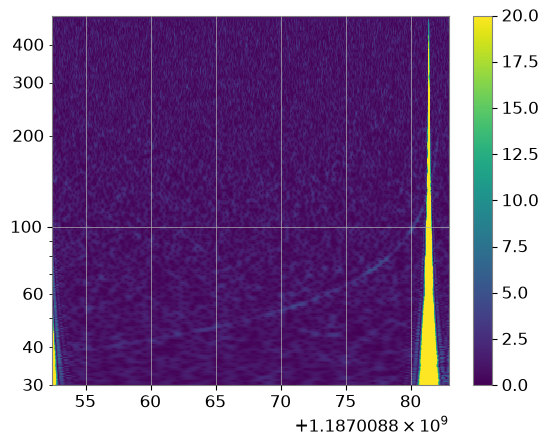

In [228]:

import matplotlib.pyplot as plt

mesh = plt.pcolormesh(times, freqs, power**0.5, vmax=5)
ax = plt.gca()
ax.set_xlim(gps-30, gps+0.5)
ax.set_yscale('log')

cbar = plt.colorbar(mesh)
cbar.mappable.set_clim(0, 20)
plt.show()


The result should tell us the same story as the GWpy Q transform, the BNS track is a physical feature in the data rather than something created by one particular package


## GW170814 Q Scans

GW170814 is a much shorter binary black hole signal than GW170817, so we can use a much smaller time interval and a lower Q range


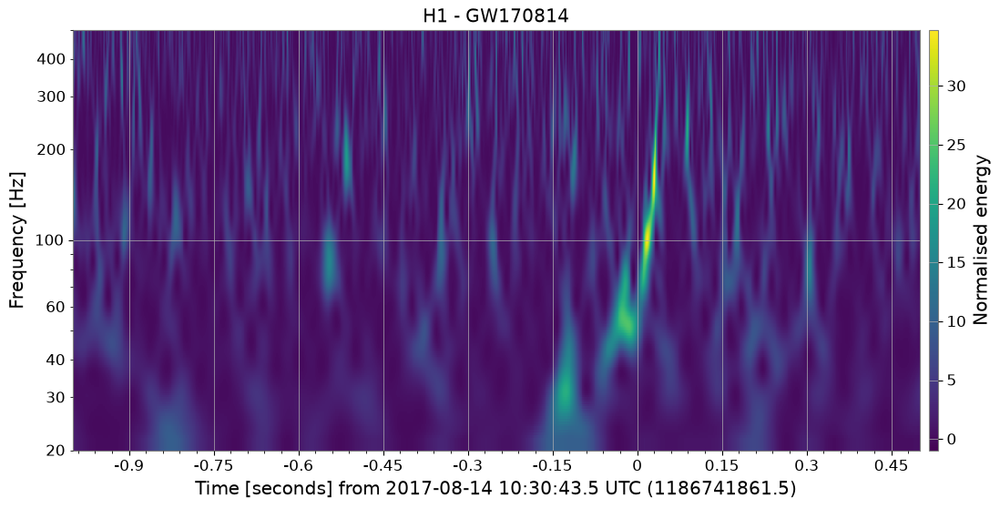

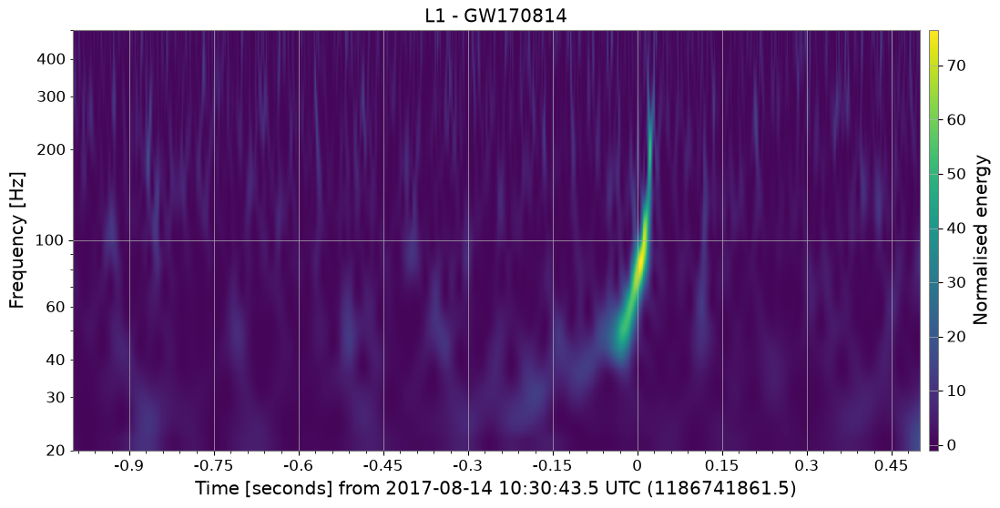

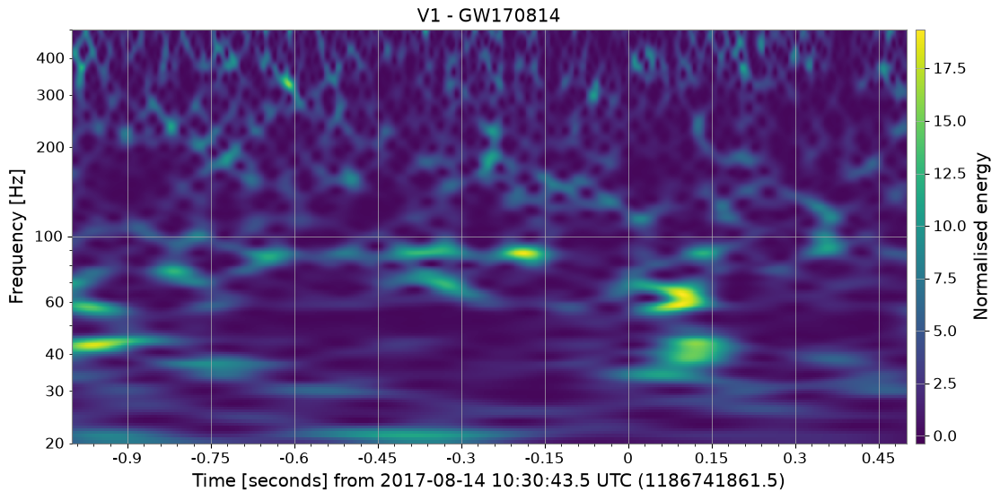

In [229]:

gps_170814 = event_gps('GW170814')
segment_q = (int(gps_170814)-4, int(gps_170814)+2)

for ifo in ['H1', 'L1', 'V1']:
    data = TimeSeries.fetch_open_data(ifo, *segment_q, cache=True)
    qscan = data.q_transform(
        frange=(20, 500),
        qrange=(4, 32),
        outseg=(gps_170814-1.0, gps_170814+0.5)
    )

    plot = qscan.plot()
    ax = plot.gca()
    ax.set_epoch(gps_170814)
    ax.set_yscale('log')
    ax.set_title(f'{ifo} - GW170814')
    ax.colorbar(label='Normalised energy')
    plot.show(warn=False)


GW170814 was registered by **Hanford, Livingston and Virgo**, although the strength of the feature is not the same in all three

That three detector observation is particularly useful because the extra detector gives much better sky localisation


## Summaryish

- A normal Fourier transform gives frequency but throws away when that frequency occurred
- A spectrogram keeps both time and frequency by repeating short Fourier transforms, which is great for looking at detector behaviour over minutes or hours
- A Q transform is better suited to short transients because it changes the time frequency resolution of the tiles
- This lets us see GW chirps and glitches directly, and gating can suppress a very loud glitch when it would otherwise dominate the analysis


# BIG summaryish

The main chain from this whole section is

$$
\text{time series}
\rightarrow
\text{Fourier transform}
\rightarrow
\text{PSD / ASD}
\rightarrow
\text{whitening}
\rightarrow
\text{time frequency analysis}
$$

The Fourier transform tells us what frequencies are present, the PSD tells us how trustworthy those frequencies are, whitening uses that information to weight the data properly, and spectrograms or Q transforms tell us when the interesting frequency content happened